[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://github.com/NktBkzn/HSE_DL_2021/blob/master/12_week/Weather_forecast_RNN.ipynb)

## Задача прогнозирования температуры

Во всех наших примерах в этом разделе мы будем играть с погодой
набором  временных рядов, записанных на метеостанции в Институте биогеохимии им. Макса Планка в Йене, Германия: http://www.bgc-jena.mpg.de/wetter/.

В этом наборе данных записано четырнадцать различных величин (таких как температура воздуха, атмосферное давление, влажность, направление ветра и т. Д.)
каждые десять минут, в течение нескольких лет. Исходные данные относятся к 2003 году, но мы ограничиваемся данными за 2009-2016 годы. Этот набор данных
идеально подходит для обучения работе с числовыми временными рядами. Мы будем использовать его для построения модели, которая принимает в качестве входных данных некоторые данные из недавнего прошлого (
несколько дней стоит данных) и прогнозирует температуру воздуха на 24 часа в будущем.


Посмотрим на данные!

In [1]:
import os

fname = 'jena_climate_2009_2016.csv'

f = open(fname)
data = f.read()
f.close()

lines = data.split('\n')
header = lines[0].split(',')
lines = lines[1:]

print(header)
print(len(lines))

['"Date Time"', '"p (mbar)"', '"T (degC)"', '"Tpot (K)"', '"Tdew (degC)"', '"rh (%)"', '"VPmax (mbar)"', '"VPact (mbar)"', '"VPdef (mbar)"', '"sh (g/kg)"', '"H2OC (mmol/mol)"', '"rho (g/m**3)"', '"wv (m/s)"', '"max. wv (m/s)"', '"wd (deg)"']
420551


In [2]:
import pandas as pd

fname = 'jena_climate_2009_2016.csv'
tmp = pd.read_csv(fname)
tmp.head(1)

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.4,-8.9,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3


In [3]:
tmp.shape

(420551, 15)

переведем все в numpy array

In [4]:
tmp.iloc[:4,1:]

,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0


In [5]:
import numpy as np

float_data = np.zeros((len(lines), len(header) - 1))
for i, line in enumerate(lines):
    values = [float(x) for x in line.split(',')[1:]]
    float_data[i, :] = values

In [6]:
float_data.shape

(420551, 14)

нарисуем график температуры

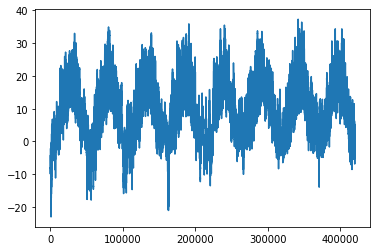

In [7]:
from matplotlib import pyplot as plt
%matplotlib inline

temp = float_data[:, 1]  # температура
plt.plot(range(len(temp)), temp)
plt.show()

На этом графике вы можете четко увидеть годовую периодичность температуры.

Вот более узкий график данных о температуре за первые десять дней (поскольку данные записываются каждые десять минут, мы получаем 144 точки данных
в день):

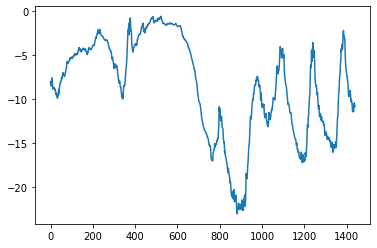

In [8]:
plt.plot(range(1440), temp[:1440])
plt.show()

На этом графике вы можете увидеть ежедневную периодичность, особенно заметную за последние 4 дня. Мы также можем отметить, что этот десятидневный период должен быть
взят из довольно холодного зимнего месяца.

Если бы мы пытались предсказать среднюю температуру для следующего месяца, учитывая данные за несколько месяцев, проблема была бы легкой из-за
достоверной годовой периодичности данных. Но, глядя на данные в масштабе дней, температура выглядит намного более хаотичной. 


In [9]:
TRAIN_VAL_TH = 200000
VAL_TEST_TH = 300000

In [10]:
mean = float_data[:TRAIN_VAL_TH].mean(axis=0)
float_data -= mean
std = float_data[:TRAIN_VAL_TH].std(axis=0)
float_data /= std

In [11]:
float_data.shape

(420551, 14)

Рассмотрим генератор данных, который мы будем использовать. Он возвращает кортеж `(samples, target)`, где `samples` - один батч данных, а
`target` -  массив целевых температур. Требуются следующие аргументы:

* `data`: исходный массив данных с плавающей запятой, который мы только что нормализовали в приведенном выше фрагменте кода.
* `lookback`: Сколько временных шагов назад должны пройти наши входные данные. Выбираем значение, равное 1440 (в нашем случае это кол-во прошедших минут).
* `delay`: через сколько шагов прогнозим
* `min_index` и` max_index`: индексы в массиве `data`, которые разграничивают временные шаги для отрисовки. 
* `shuffle`: перетасовать наши батчи или нарисовать их в хронологическом порядке.
* `batch_size`: количество данных на батч.
* `step`: период во временных шагах, с каким мы производим выборку данных. Мы установим его на 6, чтобы рисовать одну точку данных каждый час. Тогда длина полследовательности будет 1440:6= 240 (т.е. 240 10-ти минутных интервалов)

In [12]:
def generator(data, lookback, delay, min_index, max_index,
              shuffle=False, batch_size=128, step=6, logging=False):
    if max_index is None:
        max_index = len(data) - delay - 1
        # print('max index: ', max_index)

    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
                # print(f'i + batch_size>= max index ({max_index}): {i}')
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)

        samples = np.zeros((len(rows),       # batch size
                           lookback // step, # seq_len
                           data.shape[-1]))  # features number
        targets = np.zeros((len(rows),))
        for j, row in enumerate(rows):  # loop of batch size len
            indices = range(row - lookback, row, step) # indices form a sequence (total number of sequences = batch size)
            samples[j] = data[indices]
            # [1] below means that temperature is being a target
            targets[j] = data[row + delay - step][1]

            # print information about generator
            if logging:
                print('max index: ', max_index, '| min index: ', min_index, '| batch size: ', len(rows))
                print('i:', i)
                print(f'indices: all {len(list(indices))}, first {list(indices)[0]}, last {list(indices)[-1]}')
                print(f'row: {row} | delay: {delay}')
                print(f'last index + 144 = {list(indices)[-1] + 144}')
                print(f'row + delay - step: {row + delay - step}\n')
        yield samples, targets


Теперь давайте использовать нашу функцию абстрактного генератора для создания трех генераторов, одного для обучения, одного для проверки и одного для тестирования.


In [13]:
float_data.shape

(420551, 14)

In [14]:
lookback = 1440 
step = 6
delay = 144
batch_size = 128

train_gen = generator(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=TRAIN_VAL_TH,
                      shuffle=True,
                      step=step, 
                      batch_size=batch_size)
val_gen = generator(float_data,
                    lookback=lookback,
                    delay=delay,
                    min_index=TRAIN_VAL_TH+1,
                    max_index=VAL_TEST_TH,
                    step=step,
                    batch_size=batch_size)
test_gen = generator(float_data,
                     lookback=lookback,
                     delay=delay,
                     min_index=VAL_TEST_TH+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size)

# number of steps needed to cover the whole datasets
train_steps = (TRAIN_VAL_TH - 0 - lookback) // batch_size
val_steps = (VAL_TEST_TH - (TRAIN_VAL_TH+1) - lookback) // batch_size
test_steps = (len(float_data) - (VAL_TEST_TH+1) - lookback) // batch_size

print(val_steps, test_steps)

769 930


In [15]:
samples, targets = next(val_gen)

samples.shape, targets.shape

((128, 240, 14), (128,))

In [16]:
samples.shape, samples

((128, 240, 14),
 array([[[ 0.05938861,  0.52331562,  0.51419214, ...,  0.06442285,
          -0.08989213,  0.35771633],
         [ 0.07471801,  0.42729754,  0.41702063, ..., -0.44967766,
          -0.53611517,  0.18915085],
         [ 0.0912266 ,  0.23526137,  0.22602836, ..., -0.93124017,
          -1.0338255 ,  0.33462517],
         ...,
         [-0.43704826, -0.89549277, -0.85626118, ..., -0.31301804,
          -0.46746547, -0.12373437],
         [-0.50308261, -0.84465967, -0.80041549, ...,  0.2986965 ,
           0.25764698,  0.27343359],
         [-0.54435409, -0.86725216, -0.82051994, ...,  0.60455376,
           0.2061597 ,  0.01365803]],
 
        [[ 0.05820942,  0.513149  ,  0.50413991, ..., -0.02668357,
          -0.19286668,  0.32769782],
         [ 0.07825557,  0.3470942 ,  0.33771974, ..., -0.56030689,
          -0.19286668, -0.07755205],
         [ 0.10301845,  0.25107611,  0.24054824, ..., -0.69696652,
          -0.63050851, -0.1779986 ],
         ...,
         [-0.441

In [17]:
targets.shape, targets

((128,),
 array([-0.7124936 , -0.71927135, -0.71814172, -0.71814172, -0.72266022,
        -0.72491947, -0.72266022, -0.71814172, -0.7170121 , -0.71475285,
        -0.7124936 , -0.7170121 , -0.71814172, -0.7215306 , -0.72491947,
        -0.73395647, -0.73621572, -0.73169722, -0.73169722, -0.74525271,
        -0.76445633, -0.79269694, -0.79043769, -0.82432643, -0.81641906,
        -0.82093755, -0.82545605, -0.85369667, -0.87290028, -0.8875854 ,
        -0.92938151, -0.92260376, -0.942937  , -0.95423325, -0.95988137,
        -0.94632588, -0.91695564, -0.90678902, -0.89888165, -0.90565939,
        -0.93277038, -0.95536287, -0.95423325, -0.94180738, -0.91808526,
        -0.92825188, -0.94406663, -0.951974  , -0.99151086, -1.03330696,
        -1.09430669, -1.09995481, -1.10560293, -1.10673256, -1.07962157,
        -1.09204744, -1.13271392, -1.15869529, -1.15417679, -1.14513979,
        -1.14401017, -1.1135103 , -1.09091781, -1.08865857, -1.06380683,
        -1.04121434, -1.01975147, -0.95875

Немного разберемся с процедурой формирования батча\
Создадим generator с небольшими значениями параметров, чтобы все можно было увидеть глазами

In [18]:
lookback = 1440
step = 6
delay = 144
batch_size = 8

tmp_gen = generator(float_data,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=200000,
                      shuffle=False,
                      step=step, 
                      batch_size=batch_size, 
                      logging=True)

print(f'STEP 1\n')
for i, (samples, targets) in enumerate(tmp_gen):
    print(f'-------------------------------------------------------\n')
    if i == 4:
        break
    print(f'STEP {i+2}\n')

STEP 1

max index:  200000 | min index:  0 | batch size:  8
i: 1448
indices: all 240, first 0, last 1434
row: 1440 | delay: 144
last index + 144 = 1578
row + delay - step: 1578

max index:  200000 | min index:  0 | batch size:  8
i: 1448
indices: all 240, first 1, last 1435
row: 1441 | delay: 144
last index + 144 = 1579
row + delay - step: 1579

max index:  200000 | min index:  0 | batch size:  8
i: 1448
indices: all 240, first 2, last 1436
row: 1442 | delay: 144
last index + 144 = 1580
row + delay - step: 1580

max index:  200000 | min index:  0 | batch size:  8
i: 1448
indices: all 240, first 3, last 1437
row: 1443 | delay: 144
last index + 144 = 1581
row + delay - step: 1581

max index:  200000 | min index:  0 | batch size:  8
i: 1448
indices: all 240, first 4, last 1438
row: 1444 | delay: 144
last index + 144 = 1582
row + delay - step: 1582

max index:  200000 | min index:  0 | batch size:  8
i: 1448
indices: all 240, first 5, last 1439
row: 1445 | delay: 144
last index + 144 = 158

In [19]:
import math 

# lookback = 1440
# step = 6
# delay = 144
# batch_size = 128

# tmp_data = tmp.iloc[:,1:].to_numpy()

# tmp_gen = generator(tmp_data,
#                       lookback=lookback,
#                       delay=delay,
#                       min_index=VAL_TEST_TH+1,
#                       max_index=None,
#                       shuffle=False,
#                       step=step, 
#                       batch_size=batch_size, 
#                       logging=True)

# print(f'STEP 1\n')
# for i, (samples, targets) in enumerate(tmp_gen):
#     print(f'-------------------------------------------------------\n')
#     if i == 2:
#         break
#     print(f'STEP {i+2}\n')

Посмотрим на значения, которые вернул генератор, а именно на 0 и 6 элемент в батче (ВАЖНО: элементы в батче не перемешивались). 0 и 6 выбраны потому, что step=6, значит значения в `samples` под указанными индексами должны быть одинаковыми, только сдвинутыми на 1 относительно друг друга

`samples` имеет вид $bs \times SeqLen \times \#features$

In [20]:
idx1, idx2 = 0, 6
seqlen = 5
feature = 1

print(samples[idx1, :seqlen, feature])
print(samples[idx2, :seqlen, feature])

[-2.14372786 -2.03189504 -1.97428419 -1.92345108 -1.84889587]
[-2.03189504 -1.97428419 -1.92345108 -1.84889587 -1.84550699]


In [21]:
targets[:seqlen]

array([-2.1267835 , -2.15276486, -2.16970923, -2.19682022, -2.20585721])

### Вывод:
В семинарском ноутбуке мы учили модель POS tagger, которая предсказывала для каждого слова (токена) в предложении его tag, т.е. часть речи. Поэтому в конструкции `nn.LSTM().forward()`, которая возвращает *`Outputs: output, (h_n, c_n)`*, нас интересовала только первая часть `output`. Она представляет собой последовательность выходов ячеек LSTM для каждого токена. 

Напротив, в рассматриваемой задаче нам нужно по временному ряду метеоролигических показателей (например, температура) получить 1 число: прогноз температуры через 24 часа. Соответственно теперь нас будет интересовать h_n среди выходов слоя `nn.LSTM`

Перед тем как реализовать реккурентную архитектуру сделаем бэйслайн прогноз

## Здравый смысл, бейзлайн



В нашем случае температурные временные ряды можно смело считать периодическими (завтра температура, вероятно, будет близка к
температура сегодня). Таким образом, подход здравого смысла будет всегда предсказывать, что температура через
24 часа будут равны температуре прямо сейчас. Давайте оценим этот подход, используя метрику средней абсолютной ошибки (MAE).


In [22]:
from tqdm import tqdm

def evaluate_naive_method():
    batch_maes = []
    for step in tqdm(range(val_steps)):
        samples, targets = next(val_gen)
        preds = samples[:, -1, 1] # (все объекты выборки; время, соотвествующее моменту "сейчас"; столбец температура)
        mae = np.mean(np.abs(preds - targets))
        batch_maes.append(mae)

        # if step % 100 == 0:
        #   print(f'Step: {step}. Preds length: {preds.shape}')

    print(f'MAE = {np.mean(batch_maes):.4f}')
    
evaluate_naive_method()

100%|██████████| 769/769 [00:03<00:00, 230.82it/s]

MAE = 0.2780


## Реккурентная сетка
### Домашнее задание: 
Написать и обучить свою реккурентную сеть. Предлагается применить все возможные методы: bidirectional, num_layers ...

Жестких критериев, по которым будет оцениваться работа, нет
- Необходимо обучить модель и получить достойное качество
- Необходимо реализовать сеть через класс
- Нужно выделить на данных как train, так и val датасеты
- При появлении симптомов переобучения воспользоваться техникой early stopping. 
- Нужно построить графики для качества модели и Loss
- Может помочь [Dropout](https://towardsdatascience.com/12-main-dropout-methods-mathematical-and-visual-explanation-58cdc2112293) (не факт)

Для начала нам нужно предобработать данные:

* Предварительная обработка данных до формата, который нейронная сеть может принять. Каждый временной ряд в данных имеет разный масштаб (например, температура обычно составляет от -20 до +30, но
давление, измеренное в мбар, составляет около 1000). Поэтому нужно всё нормализовывать



In [23]:
# import
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import StandardScaler
import math
from tqdm import tqdm
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
%matplotlib inline

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

if device.type == 'cuda':
    from torch.cuda import FloatTensor, LongTensor
else:
    from torch import FloatTensor, LongTensor

# torch.manual_seed(212)

Using device: cuda


In [24]:
# load data from csv file
# path = '/Users/alexandersolomentsev/Documents/GitHub/HSE_DL_2022_Spring/Homework/hw_data/'
fname = 'jena_climate_2009_2016.csv'
tmp = pd.read_csv(fname)
tmp.head(1)

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.4,-8.9,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3


In [25]:
# split data
TRAIN_VAL_TH = 300000
VAL_TEST_TH = 360000

train_data = tmp.iloc[:TRAIN_VAL_TH,1:]

# normalize data
scaler =  StandardScaler()
scaler.fit(train_data)
data_scaled = scaler.transform(tmp.iloc[:,1:])

In [26]:
# generator
def generator(data, lookback, delay, min_index, max_index,
              shuffle=False, batch_size=128, step=6, logging=False):
    if max_index is None:
        max_index = len(data) - delay - 1
        # print('max index: ', max_index)

    i = min_index + lookback
    while 1:
        if shuffle:
            rows = np.random.randint(
                min_index + lookback, max_index, size=batch_size)
        else:
            if i + batch_size >= max_index:
                i = min_index + lookback
                # print(f'i + batch_size>= max index ({max_index}): {i}')
            rows = np.arange(i, min(i + batch_size, max_index))
            i += len(rows)

        samples = np.zeros((len(rows),       # batch size
                           lookback // step, # seq_len
                           data.shape[-1]))  # features number
        targets = np.zeros((len(rows),))
        for j, row in enumerate(rows):  # loop of batch size len
            indices = range(row - lookback, row, step) # indices form a sequence (total number of sequences = batch size)
            samples[j] = data[indices]
            # [1] below means that temperature is being a target
            targets[j] = data[row + delay - step][1]

            # print information about generator
            if logging:
                print('max index: ', max_index, '| min index: ', min_index, '| batch size: ', len(rows))
                print('i:', i)
                print(f'indices: all {len(list(indices))}, first {list(indices)[0]}, last {list(indices)[-1]}')
                print(f'row: {row} | delay: {delay}')
                print(f'last index + 144 = {list(indices)[-1] + 144}')
                print(f'row + delay - step: {row + delay - step}\n')
        yield samples, targets

In [27]:
# generator parametrs
lookback = 1440 
step = 6
delay = 144
batch_size = 128

# generate data
train_gen = generator(data_scaled,
                      lookback=lookback,
                      delay=delay,
                      min_index=0,
                      max_index=TRAIN_VAL_TH,
                      shuffle=True,
                      step=step, 
                      batch_size=batch_size, 
                      logging=False)
val_gen = generator(data_scaled,
                    lookback=lookback,
                    delay=delay,
                    min_index=TRAIN_VAL_TH+1,
                    max_index=VAL_TEST_TH,
                    step=step,
                    batch_size=batch_size,
                    logging=False)
test_gen = generator(data_scaled,
                     lookback=lookback,
                     delay=delay,
                     min_index=VAL_TEST_TH+1,
                     max_index=None,
                     step=step,
                     batch_size=batch_size, 
                     logging=False)

In [28]:
# RNN Class
class LSTMWeather(nn.Module):
    def __init__(self, input_size, hidden_size, bidirectional=False, dropout=0, num_layers=1):
        super().__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.bidirectional = bidirectional
        self.num_layers = num_layers

        self._lstm = nn.LSTM(input_size= input_size,
                             hidden_size= hidden_size,
                             num_layers= num_layers,
                             dropout= dropout,
                             bidirectional= bidirectional, 
                             batch_first= True)

        self._out_layer = nn.Linear(in_features= hidden_size, 
                                    out_features= 1)

    def forward(self, inputs):
        _, (h_n, _) = self._lstm(inputs)
        h_n = h_n.mean(axis=0) if self.bidirectional else h_n[-1] # last cell or mean of all
        predictions = self._out_layer(h_n)
        
        return predictions

In [29]:
# # model parametrs
# HIDDEN_SIZE = 32
# n_features = data_scaled.shape[1]

# # model
# lstm_wheather = LSTMWeather(input_size= n_features, 
#                             hidden_size= HIDDEN_SIZE, 
#                             bidirectional=True, 
#                             dropout=0.2, 
#                             num_layers=3).to(device)

# # optimizer and criterion
# criterion = nn.MSELoss(reduction='sum').to(device)
# optimizer = optim.Adam(lstm_wheather.parameters(), lr=1e-5, weight_decay=0.1)

In [69]:
# ploting functions
def plot_figure(train_loss, val_loss, predictions, y_true):
    train_loss = np.array(train_loss).flatten()
    val_loss = np.array(val_loss).flatten()
    predictions = np.array(predictions).flatten()
    y_true = np.array(y_true).flatten()
    t_1 = range(len(train_loss))
    t_2 = range(len(val_loss))
    t_3 = range(len(predictions))
    
    fig = plt.figure(figsize= (20,10)) # constrained_layout=True, 
    gs = gridspec.GridSpec(ncols=2, nrows=2)
    
    ax_0 = fig.add_subplot(gs[0, 0])
    ax_0.plot(t_1, train_loss)
    ax_0.set_title('TRAIN Loss')
    ax_0.set_xlabel('epochs')
    ax_0.set_ylabel('loss')
    
    ax_1 = fig.add_subplot(gs[0, 1])
    ax_1.plot(t_2, val_loss)
    ax_1.set_title('VALUATION Loss')
    ax_1.set_xlabel('epochs')
    ax_1.set_ylabel('loss')
    
    bottom_axis = fig.add_subplot(gs[1,:])
    bottom_axis.plot(t_3, predictions, label='model')
    bottom_axis.plot(t_3, y_true, label='real')
    bottom_axis.set_title('All valuation data')
    bottom_axis.set_xlabel('epochs')
    bottom_axis.set_ylabel('loss')
    plt.show()
    
def plot_prediction(X_batch, y_batch, preds, n):
    X_batch = X_batch[:,:,1]
    points = X_batch.shape[1]
    fig, ax = plt.subplots(nrows=(n // 2 + n % 2), ncols=2, figsize=(16,160), constrained_layout=True)
    for i in range(n):
        ax[i//2, i%2].plot(range(points), X_batch[i], color='blue')
        ax[i//2, i%2].plot(points+1, y_batch[i], marker='x', color='red', label='real')
        ax[i//2, i%2].plot(points+1, preds[i], marker='*', color='green', label='pred')
        ax[i//2, i%2].set_title(f'Prediction {i+1}')
        ax[i//2, i%2].set_xlabel('time points')
        ax[i//2, i%2].set_ylabel('Temperature (in DegC)')
        ax[i//2, i%2].legend()
    if n % 2 == 1:
        ax[n//2, n%2].remove()
        
    plt.show()

In [73]:
# train RNN

def do_epoch(model, criterion, data, batch_size, optimizer=None, name=None):
    epoch_loss = []
    predictions = []
    y_true = []
    
    is_train = not optimizer is None
    name = name or ''
    model.train(is_train)
    
    if 'train' in name.lower():
        batches_count = math.ceil(TRAIN_VAL_TH / batch_size)
        min_index=0
        max_index=TRAIN_VAL_TH
        shuffle=False
        print(f'Train parametrs: {min_index} | {max_index} | {batch_size} | {shuffle}')
    
    elif 'val' in name.lower():
        batches_count = math.ceil((VAL_TEST_TH - TRAIN_VAL_TH) / batch_size)
        min_index=TRAIN_VAL_TH+1
        max_index=VAL_TEST_TH
        shuffle=False
        print(f'Valuation parametrs: {min_index} | {max_index} | {batch_size} | {shuffle}')

    data_generator = generator(data,
                               lookback=1440,
                               delay=144,
                               min_index=min_index,
                               max_index=max_index,
                               shuffle=shuffle,
                               step=6, 
                               batch_size=batch_size, 
                               logging=False)

    with torch.autograd.set_grad_enabled(is_train):
        with tqdm(total=batches_count) as progress_bar:
            for i, (X_batch, y_batch) in enumerate(data_generator):
                X_batch, y_batch = FloatTensor(X_batch), FloatTensor(y_batch)
                if optimizer:
                    optimizer.zero_grad()
                batch_predictions = model(X_batch).reshape_as(y_batch)

                loss = 0
                loss = criterion(batch_predictions, y_batch)

                if optimizer:
                    loss.backward()
                    optimizer.step()

                epoch_loss.append(loss.item())
                predictions.append(batch_predictions.cpu().detach().numpy())
                y_true.append(y_batch.cpu().detach().numpy())

                progress_bar.update()
                progress_bar.set_description('{:>5s} MSE Loss = {:.5f}'.format(
                    name, loss)
                )

                if i - 1 == batches_count:
                    break
                
            progress_bar.set_description('{:>5s} MSE Loss = {:.5f}'.format(
                name, np.mean(epoch_loss))
            )

    return epoch_loss, predictions, y_true

def run_train(model, criterion, optimizer, data, epochs_count=1, batch_size=64, 
              evaluate=None, val_batch_size=None):
        
    if not evaluate is False and val_batch_size is None:
        val_batch_size = batch_size
        
    for epoch in range(epochs_count):
        name_prefix = '[{} / {}] '.format(epoch + 1, epochs_count)
        train_loss, _, _ = do_epoch(model, criterion, data, batch_size, optimizer, name_prefix + 'Train:')
        
        if not evaluate is False:
            val_loss, predictions, y_true = do_epoch(model, criterion, data, val_batch_size, None, name_prefix + '  Val:')

        plot_figure(train_loss, val_loss, predictions, y_true)

    return train_loss, val_loss

________________________________________

### Exploratory Data Analysis

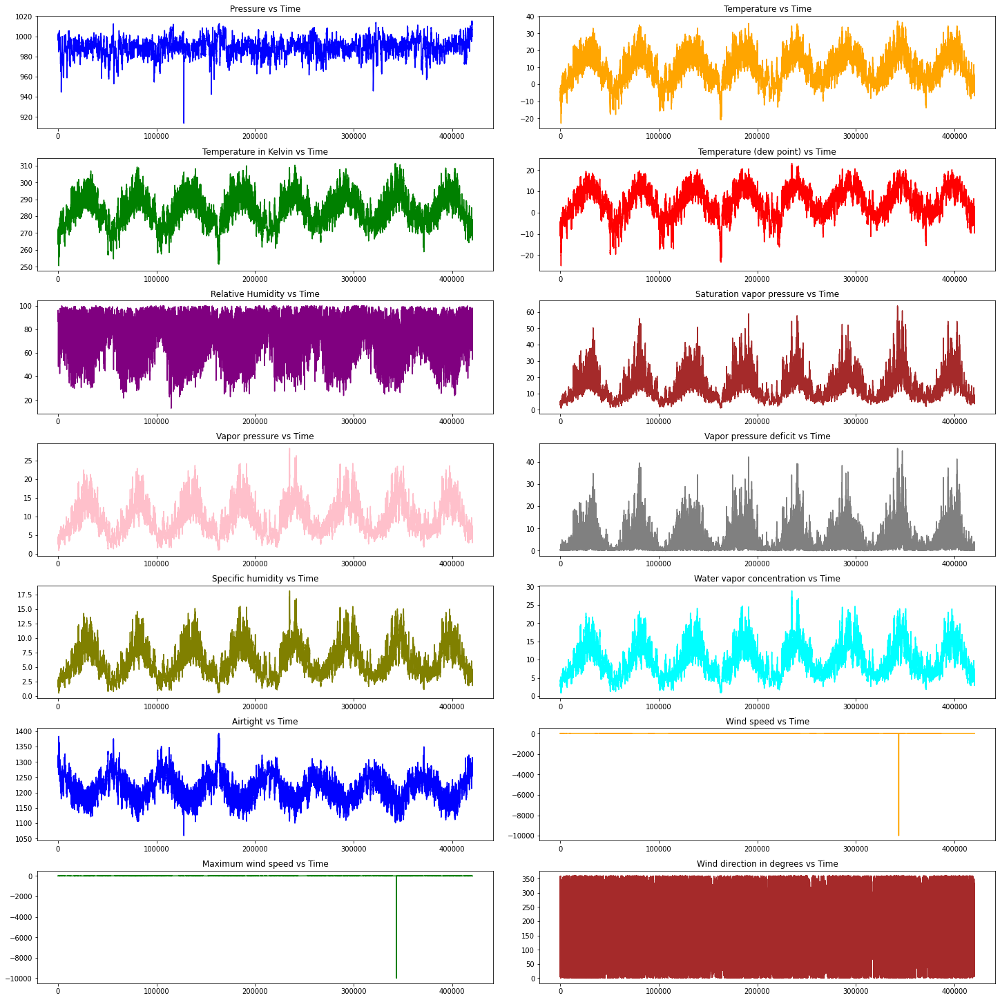

In [32]:
titles = [
    "Pressure",
    "Temperature",
    "Temperature in Kelvin",
    "Temperature (dew point)",
    "Relative Humidity",
    "Saturation vapor pressure",
    "Vapor pressure",
    "Vapor pressure deficit",
    "Specific humidity",
    "Water vapor concentration",
    "Airtight",
    "Wind speed",
    "Maximum wind speed",
    "Wind direction in degrees",
]

colors = [
    "blue",
    "orange",
    "green",
    "red",
    "purple",
    "brown",
    "pink",
    "gray",
    "olive",
    "cyan",
    "blue",
    "orange",
    "green",
    "brown",
]

t = tmp['Date Time'].shape[0]

def plot_time_series(df, titles, t, colors):
    fig, axs = plt.subplots(ncols=2, nrows=7, figsize=(20,20), constrained_layout=True)
    
    for i in range(len(titles)):
        axs[i // 2, i % 2].plot(range(t), df.iloc[:,i+1], color= colors[i])
        axs[i // 2, i % 2].set_title(f'{titles[i]} vs Time')
    
    plt.show()

plot_time_series(tmp, titles, t, colors)

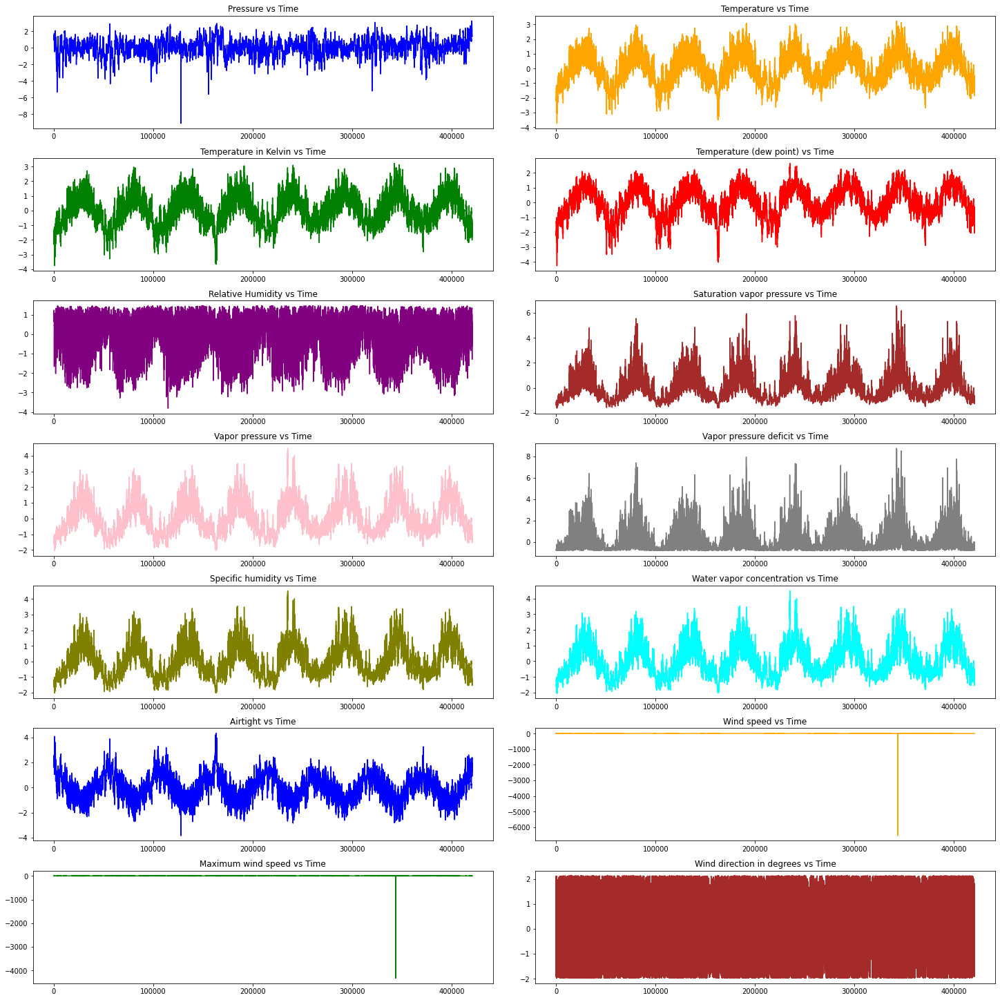

In [33]:
df_scacled = pd.concat([tmp['Date Time'], pd.DataFrame(data_scaled)], axis=1)
df_scacled.columns = tmp.columns

plot_time_series(df_scacled, titles, t, colors)

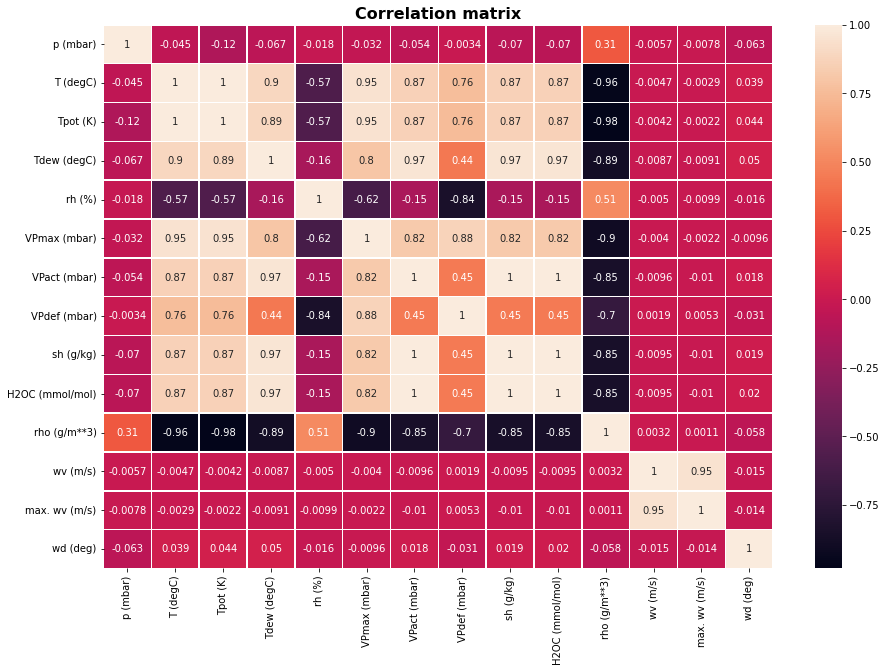

In [34]:
f, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(tmp.iloc[:,1:].corr(), annot=True, linewidths=.5, ax=ax)
ax.set_title('Correlation matrix', fontsize=16, fontweight='bold')
plt.show()

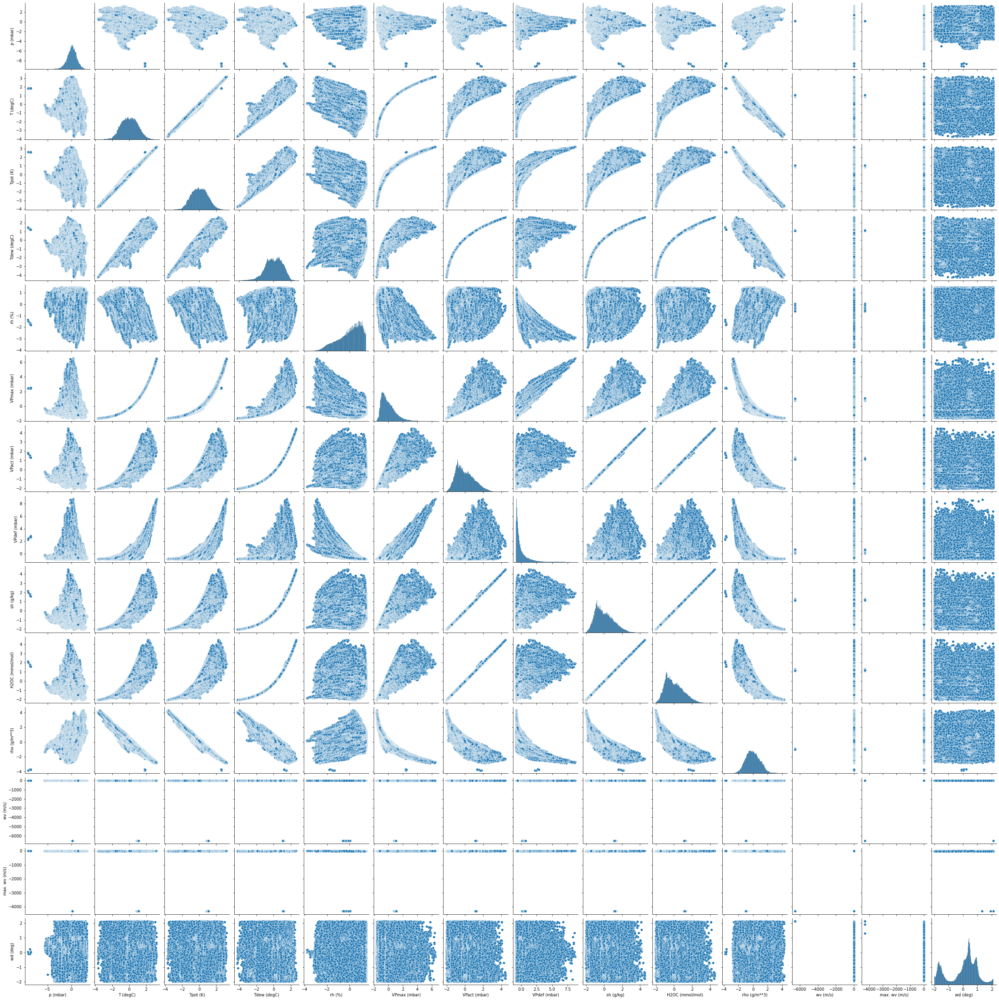

In [35]:
sns.pairplot(pd.DataFrame(data_scaled, columns=tmp.columns[1:]))

Скорее всего возникает взрыв градиента, так как обучение нестабильно. Пути решения:
*   batch normalization
*   dropout
*   L-2 regularization
*   early stopping
*   gradient clipping
*   Обучать сетку не целиком, а по кусочкам
*   Аккуратно инициализировать веса
*   skip-connection

**Попробуем последовательно каждый из элементов.**

1.  Simple LSTM
2.  L-2 regularization + learning rate Adam optimizer
3.  2 LSTM layers – it's last values as input to linear layer
4.  dropout = 15% + 3 LSTM layers – it's last values as input to linear layer
5.  BiLSTM + dropout = 15% + 3 LSTM layers – it's mean values as input to linear layer
6.  BiLSTM + dropout = 15% + 3 LSTM layers + skip-connection – it's mean values as input to linear layer

Включить далее
*  early stopping
*  gradient clipping
*  skip-connection

In [36]:
# model parametrs
HIDDEN_SIZE = 64
n_features = data_scaled.shape[1]
batch_size = 64
epochs = 20

Train parametrs: 0 | 300000 | 64 | False


[1 / 20] Train: MSE Loss = 10.61080: : 4690it [01:10, 66.75it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[1 / 20]   Val: MSE Loss = 84.46371: : 120it [00:03, 31.16it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


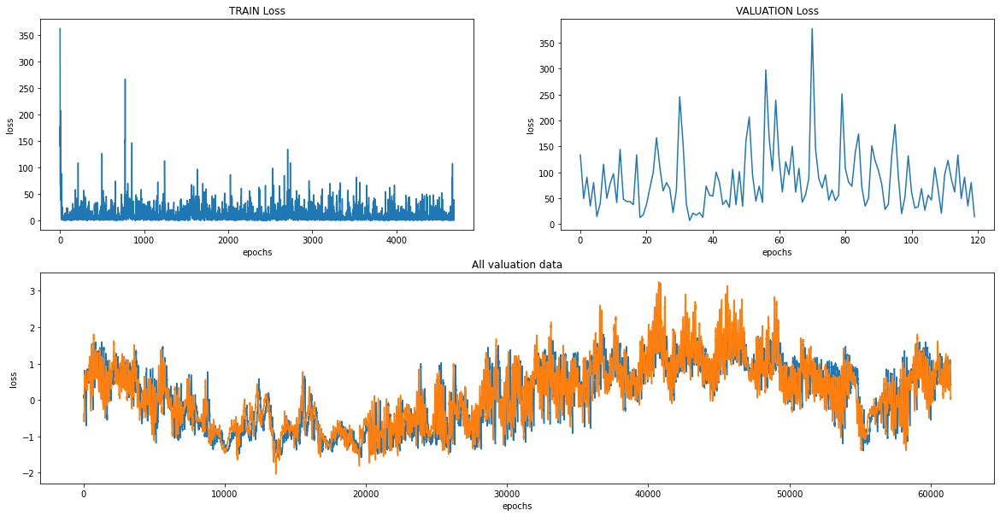

Train parametrs: 0 | 300000 | 64 | False


[2 / 20] Train: MSE Loss = 9.29875: : 4690it [01:11, 66.02it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[2 / 20]   Val: MSE Loss = 78.45782: : 120it [00:03, 30.05it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


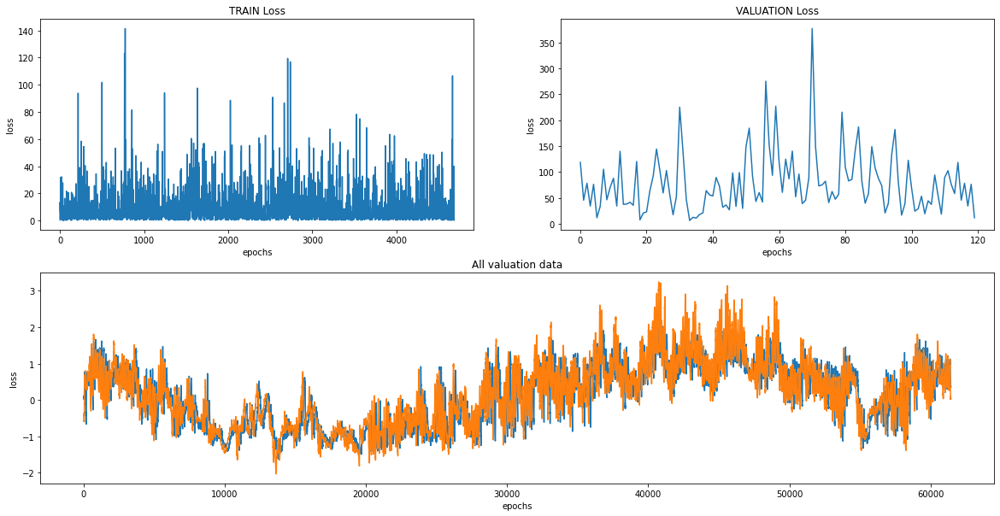

Train parametrs: 0 | 300000 | 64 | False


[3 / 20] Train: MSE Loss = 8.96017: : 4690it [01:16, 61.40it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[3 / 20]   Val: MSE Loss = 75.88931: : 120it [00:04, 27.69it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


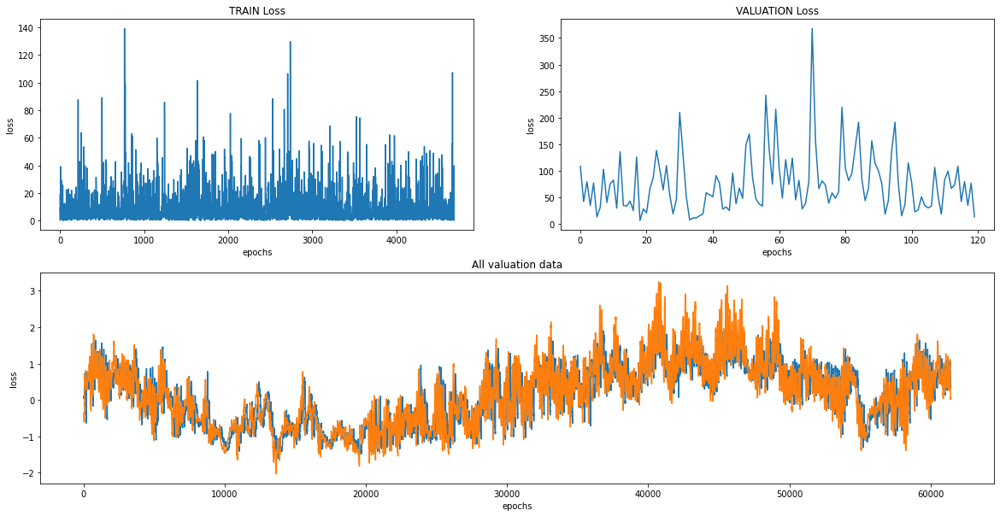

Train parametrs: 0 | 300000 | 64 | False


[4 / 20] Train: MSE Loss = 8.68578: : 4690it [01:20, 58.61it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[4 / 20]   Val: MSE Loss = 74.58024: : 120it [00:04, 27.01it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


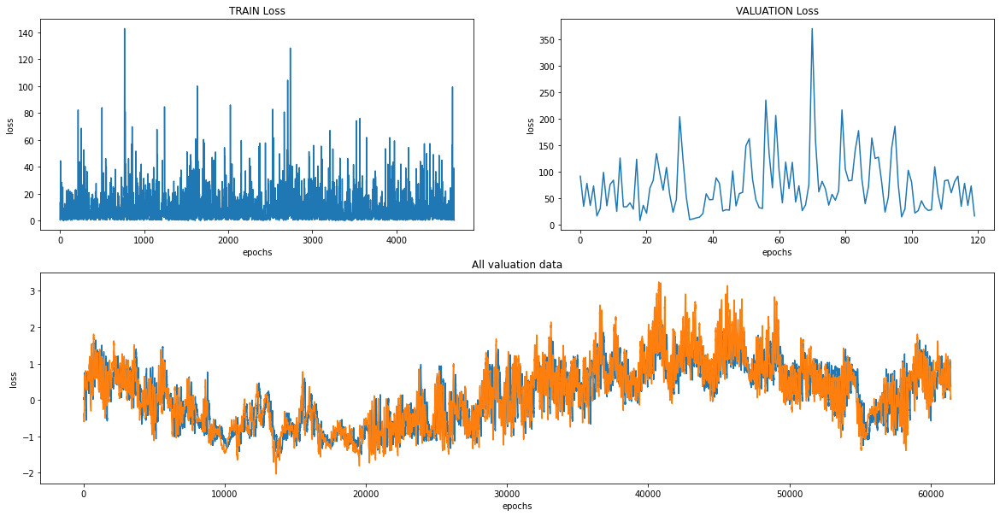

Train parametrs: 0 | 300000 | 64 | False


[5 / 20] Train: MSE Loss = 8.51212: : 4690it [01:20, 58.36it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[5 / 20]   Val: MSE Loss = 73.97290: : 120it [00:04, 25.96it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


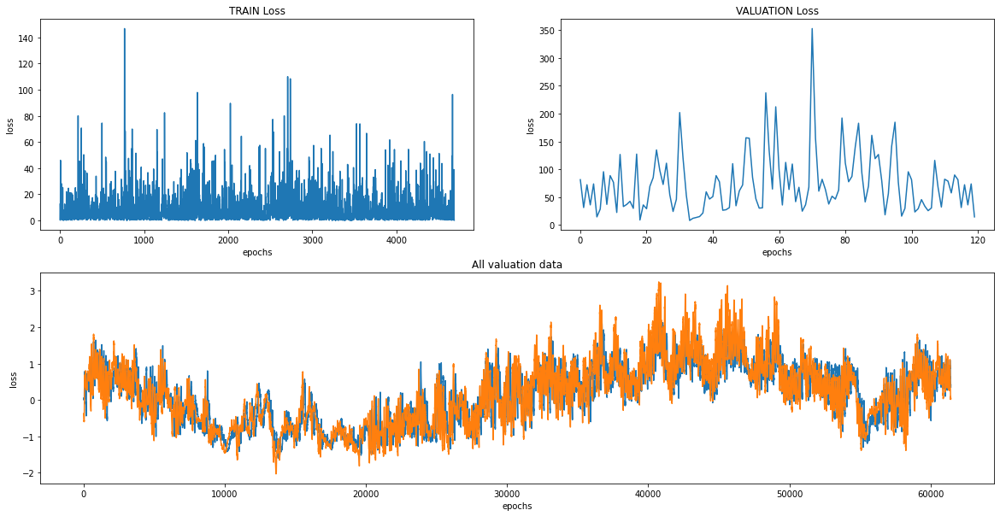

Train parametrs: 0 | 300000 | 64 | False


[6 / 20] Train: MSE Loss = 8.30837: : 4690it [01:21, 57.43it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[6 / 20]   Val: MSE Loss = 73.71939: : 120it [00:04, 25.15it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


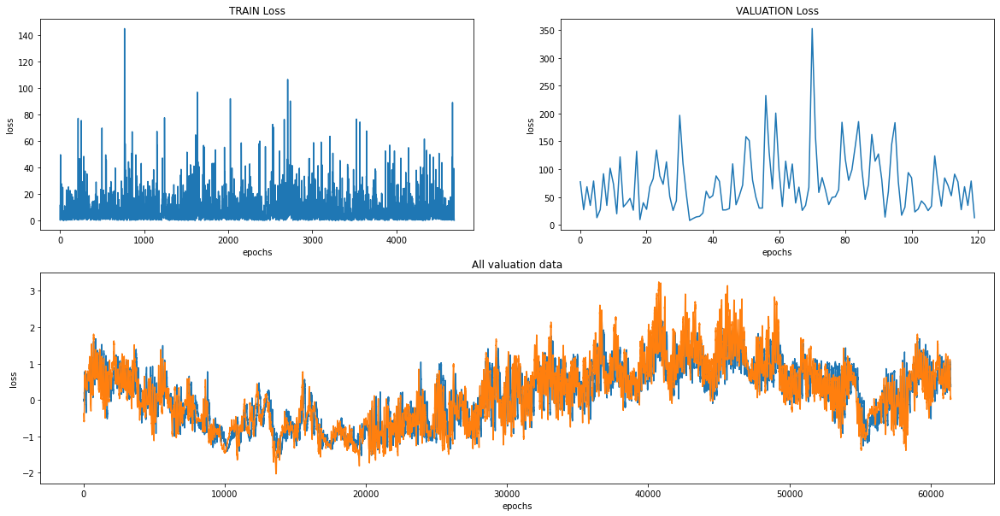

Train parametrs: 0 | 300000 | 64 | False


[7 / 20] Train: MSE Loss = 8.21709: : 4690it [01:20, 58.04it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[7 / 20]   Val: MSE Loss = 74.00124: : 120it [00:06, 19.18it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


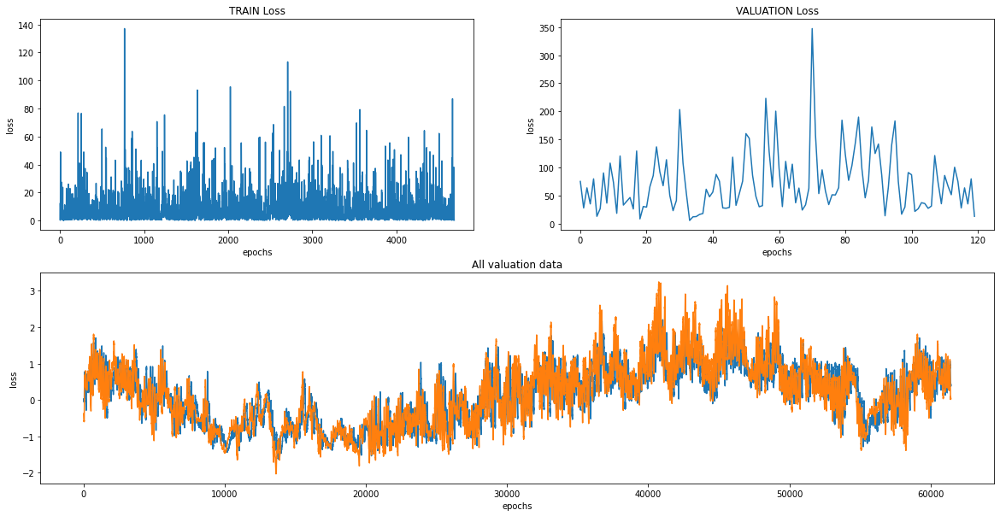

Train parametrs: 0 | 300000 | 64 | False


[8 / 20] Train: MSE Loss = 8.06704: : 4690it [01:21, 57.77it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[8 / 20]   Val: MSE Loss = 74.03777: : 120it [00:06, 19.23it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


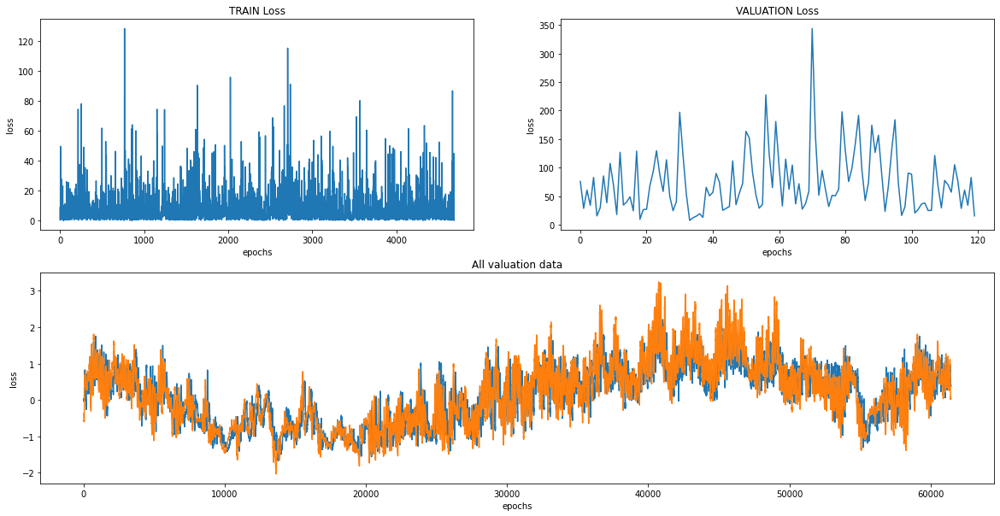

Train parametrs: 0 | 300000 | 64 | False


[9 / 20] Train: MSE Loss = 7.99214: : 4690it [01:21, 57.48it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[9 / 20]   Val: MSE Loss = 73.44834: : 120it [00:06, 19.46it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


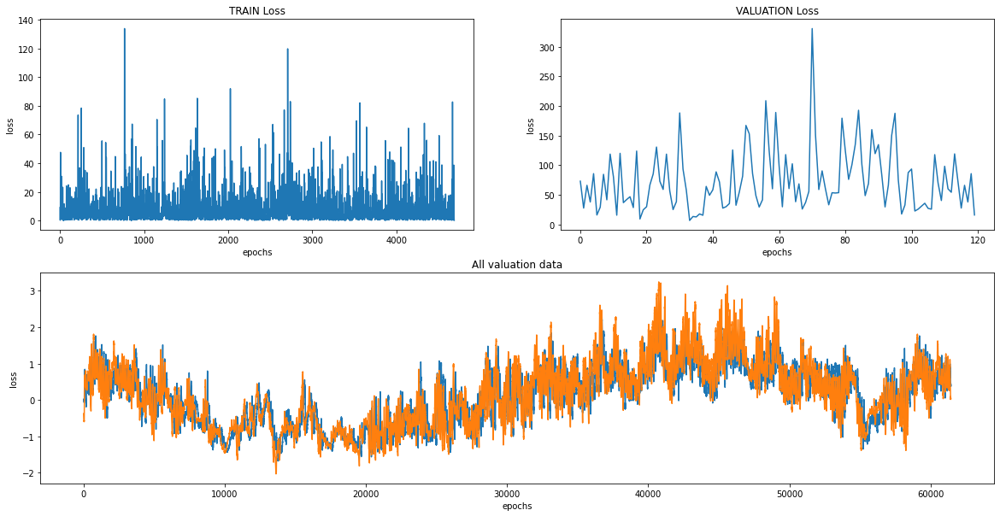

Train parametrs: 0 | 300000 | 64 | False


[10 / 20] Train: MSE Loss = 7.90021: : 4690it [01:21, 57.83it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[10 / 20]   Val: MSE Loss = 74.91051: : 120it [00:06, 19.58it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


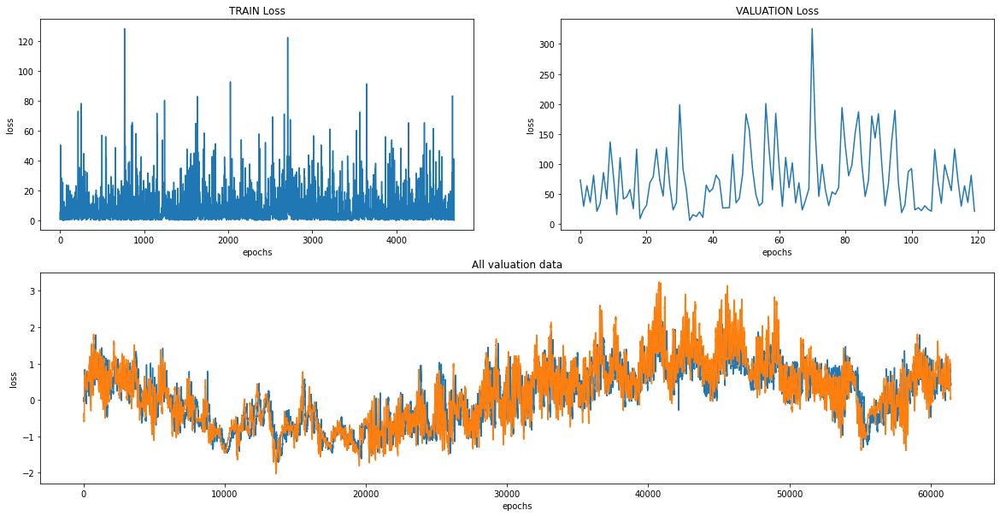

Train parametrs: 0 | 300000 | 64 | False


[11 / 20] Train: MSE Loss = 7.78894: : 4690it [01:21, 57.32it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[11 / 20]   Val: MSE Loss = 75.78226: : 120it [00:06, 19.41it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


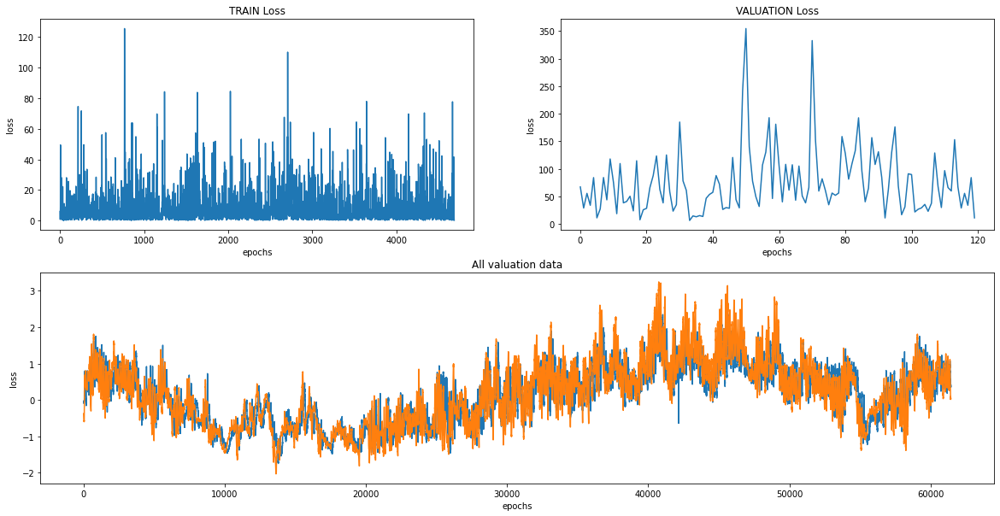

Train parametrs: 0 | 300000 | 64 | False


[12 / 20] Train: MSE Loss = 7.71660: : 4690it [01:21, 57.62it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[12 / 20]   Val: MSE Loss = 81.38446: : 120it [00:06, 19.31it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


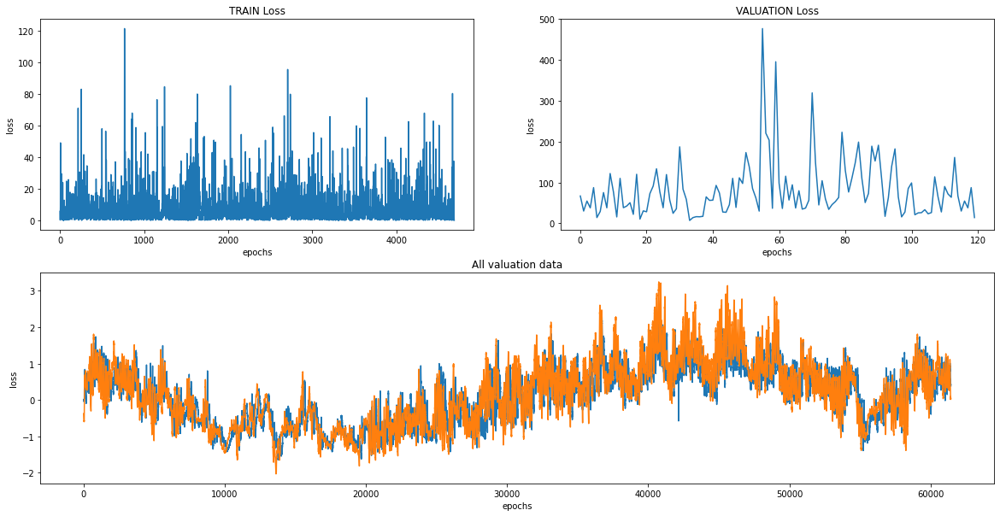

Train parametrs: 0 | 300000 | 64 | False


[13 / 20] Train: MSE Loss = 7.55415: : 4690it [01:22, 57.14it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[13 / 20]   Val: MSE Loss = 73.02420: : 120it [00:05, 20.42it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


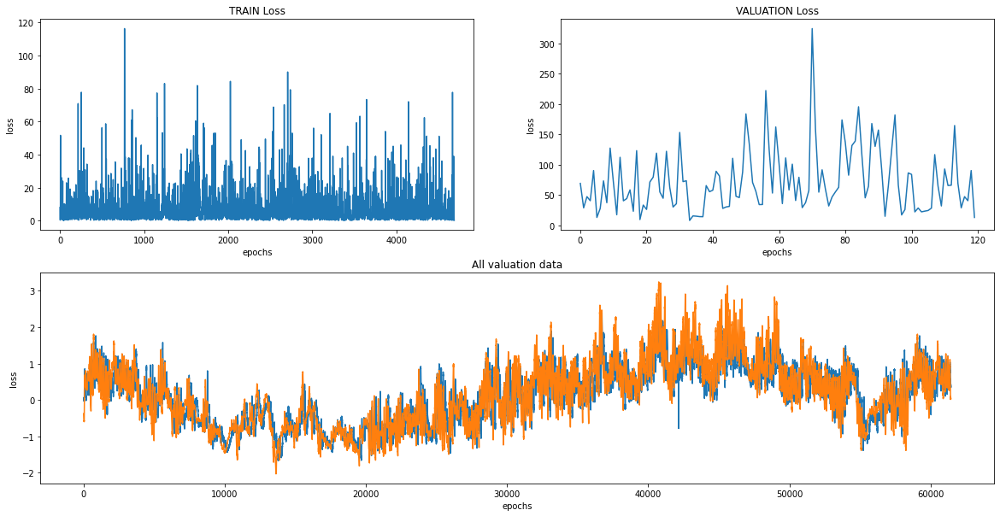

Train parametrs: 0 | 300000 | 64 | False


[14 / 20] Train: MSE Loss = 7.58795: : 4690it [01:22, 56.85it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[14 / 20]   Val: MSE Loss = 73.99730: : 120it [00:05, 20.12it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


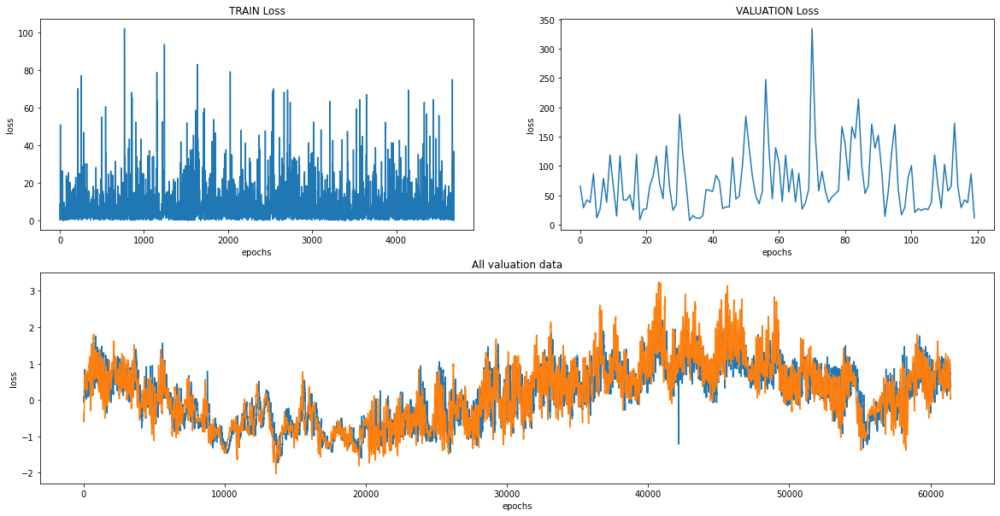

Train parametrs: 0 | 300000 | 64 | False


[15 / 20] Train: MSE Loss = 7.49321: : 4690it [01:22, 57.10it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[15 / 20]   Val: MSE Loss = 74.92809: : 120it [00:06, 19.69it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


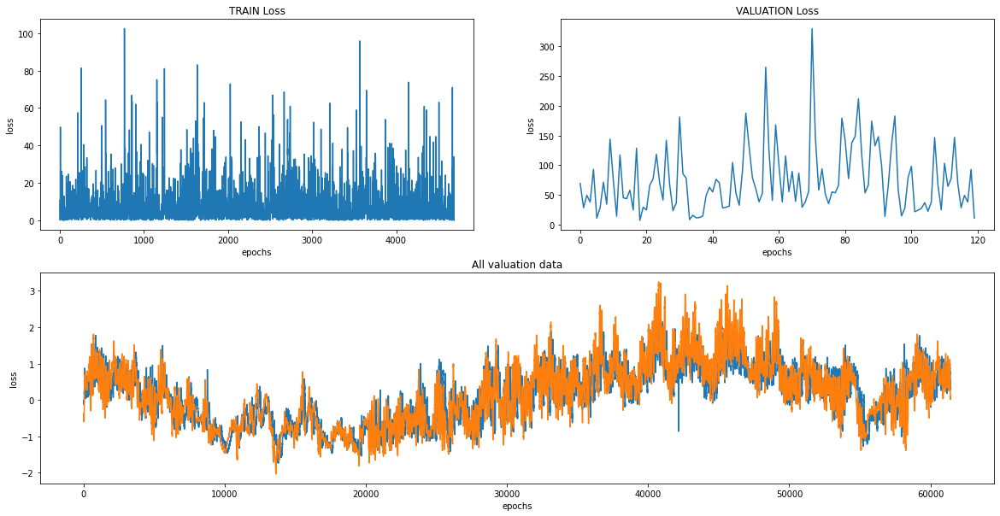

Train parametrs: 0 | 300000 | 64 | False


[16 / 20] Train: MSE Loss = 7.37010: : 4690it [01:21, 57.35it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[16 / 20]   Val: MSE Loss = 77.21320: : 120it [00:06, 19.91it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


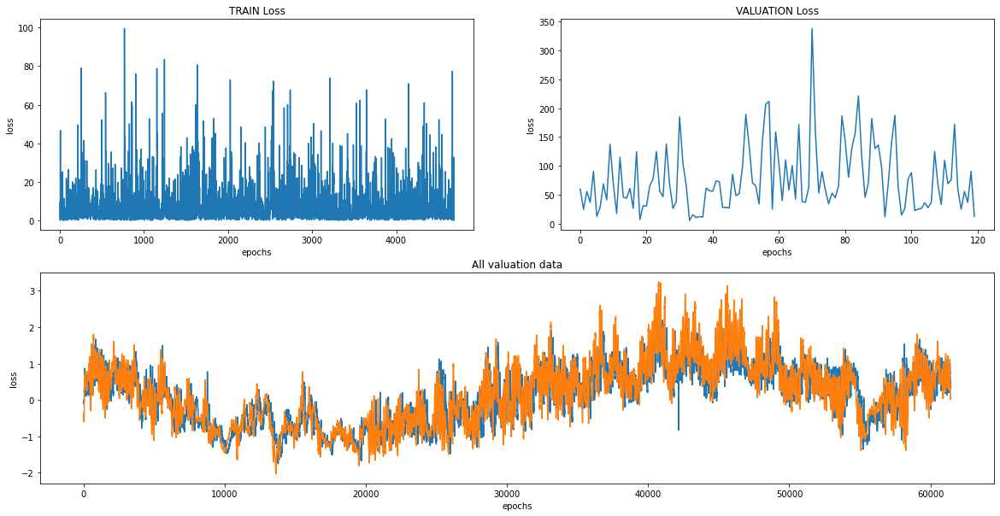

Train parametrs: 0 | 300000 | 64 | False


[17 / 20] Train: MSE Loss = 7.25575: : 4690it [01:22, 56.74it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[17 / 20]   Val: MSE Loss = 77.45984: : 120it [00:05, 20.18it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


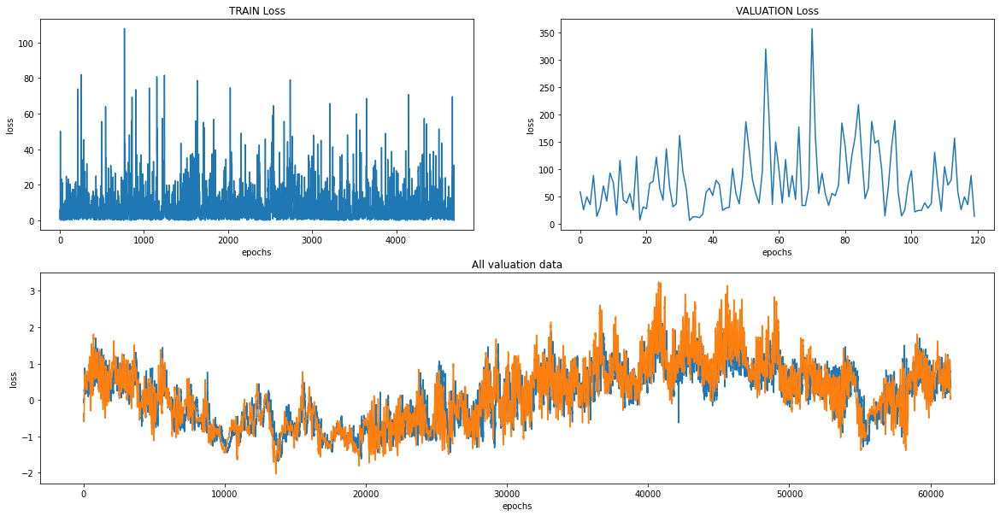

Train parametrs: 0 | 300000 | 64 | False


[18 / 20] Train: MSE Loss = 7.15562: : 4690it [01:22, 56.86it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[18 / 20]   Val: MSE Loss = 78.07068: : 120it [00:06, 19.59it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


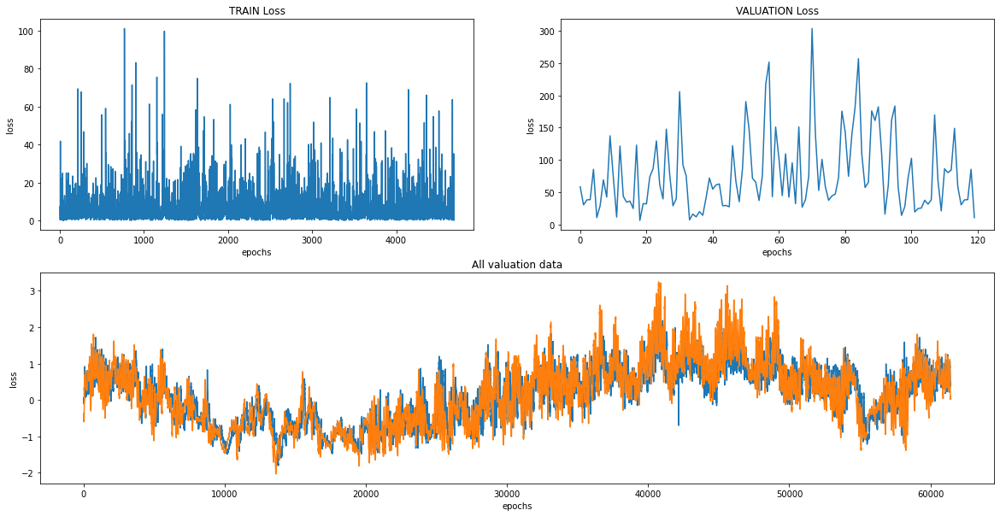

Train parametrs: 0 | 300000 | 64 | False


[19 / 20] Train: MSE Loss = 7.08821: : 4690it [01:22, 56.66it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[19 / 20]   Val: MSE Loss = 75.61869: : 120it [00:05, 20.52it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


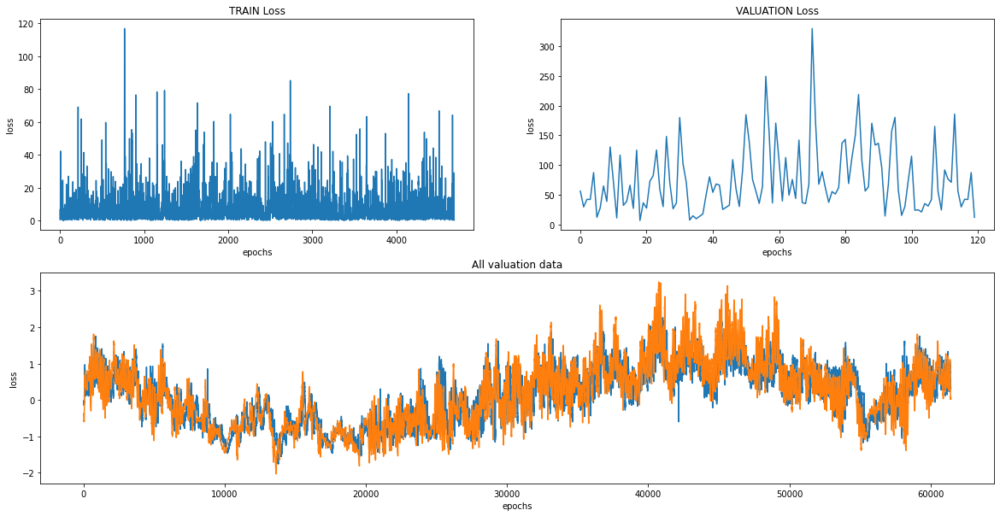

Train parametrs: 0 | 300000 | 64 | False


[20 / 20] Train: MSE Loss = 6.92978: : 4690it [01:22, 57.07it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[20 / 20]   Val: MSE Loss = 77.62034: : 120it [00:06, 19.17it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


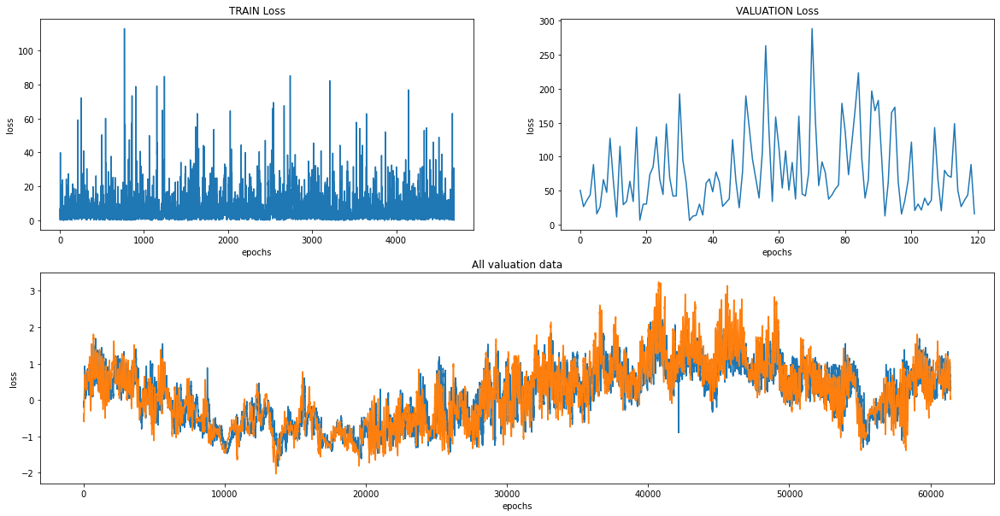

In [67]:
# model 1 – Simple LSTM
lstm_wheather = LSTMWeather(input_size= n_features, 
                            hidden_size= HIDDEN_SIZE, 
                            bidirectional=False, 
                            dropout=0, 
                            num_layers=1).to(device)

# optimizer and criterion
criterion = nn.MSELoss(reduction='sum').to(device)
optimizer = optim.Adam(lstm_wheather.parameters())


train_loss, val_loss = run_train(lstm_wheather, 
                                 criterion, 
                                 optimizer, 
                                 data_scaled, 
                                 epochs_count=epochs, 
                                 batch_size=batch_size, 
                                 evaluate=True, 
                                 val_batch_size=512)

Train parametrs: 0 | 300000 | 64 | False


[1 / 20] Train: MSE Loss = 28.35262: : 4690it [01:46, 44.06it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[1 / 20]   Val: MSE Loss = 120.48452: : 120it [00:04, 27.22it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


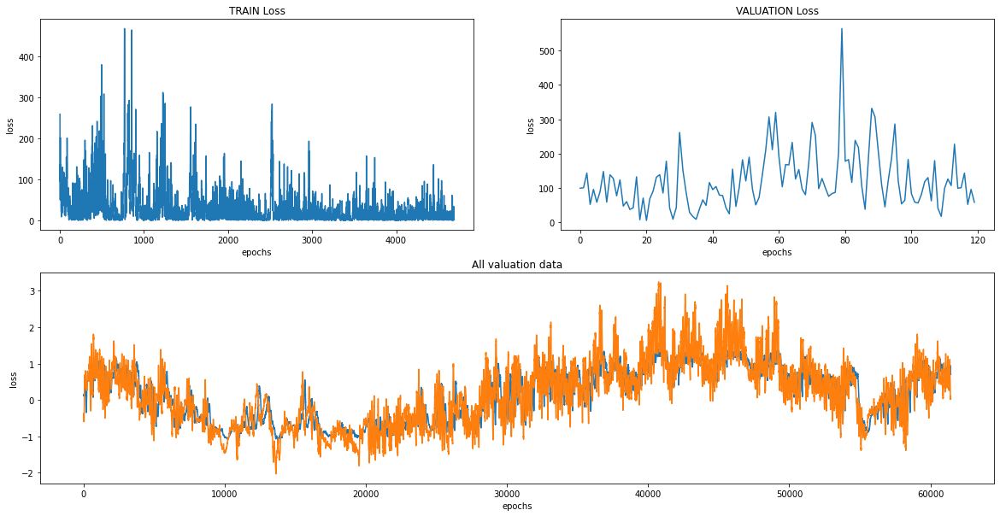

Train parametrs: 0 | 300000 | 64 | False


[2 / 20] Train: MSE Loss = 14.00331: : 4690it [01:39, 47.01it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[2 / 20]   Val: MSE Loss = 105.94245: : 120it [00:04, 25.99it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


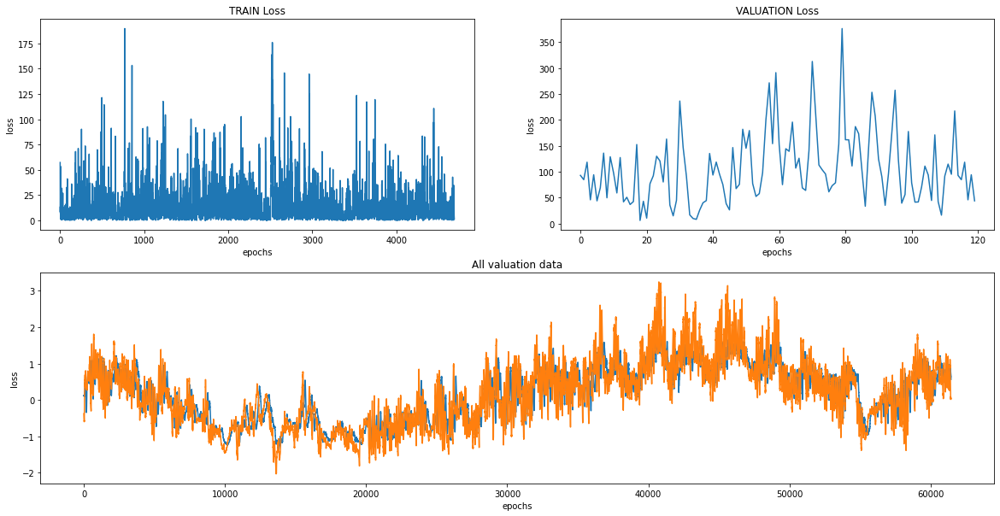

Train parametrs: 0 | 300000 | 64 | False


[3 / 20] Train: MSE Loss = 12.22975: : 4690it [01:42, 45.62it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[3 / 20]   Val: MSE Loss = 96.96880: : 120it [00:04, 25.62it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


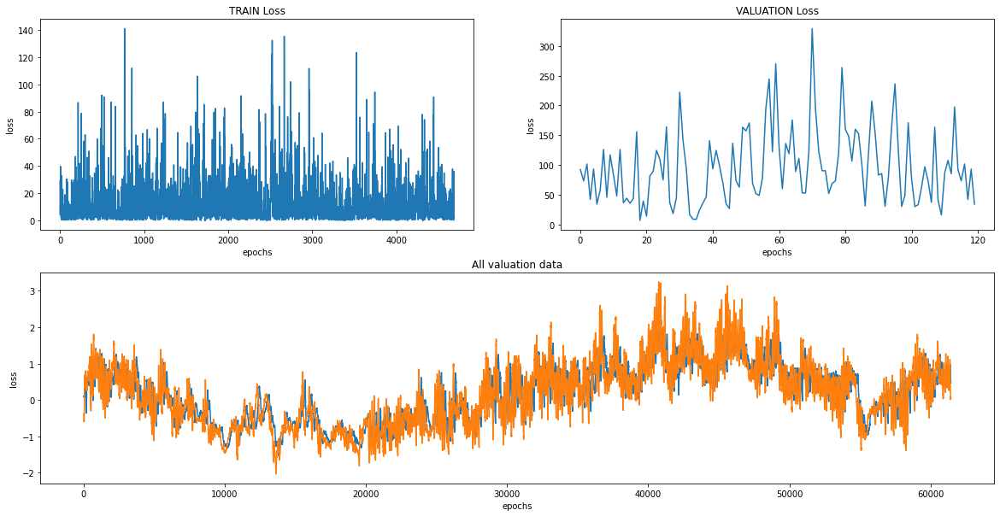

Train parametrs: 0 | 300000 | 64 | False


[4 / 20] Train: MSE Loss = 11.22295: : 4690it [01:47, 43.65it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[4 / 20]   Val: MSE Loss = 90.91355: : 120it [00:04, 24.70it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


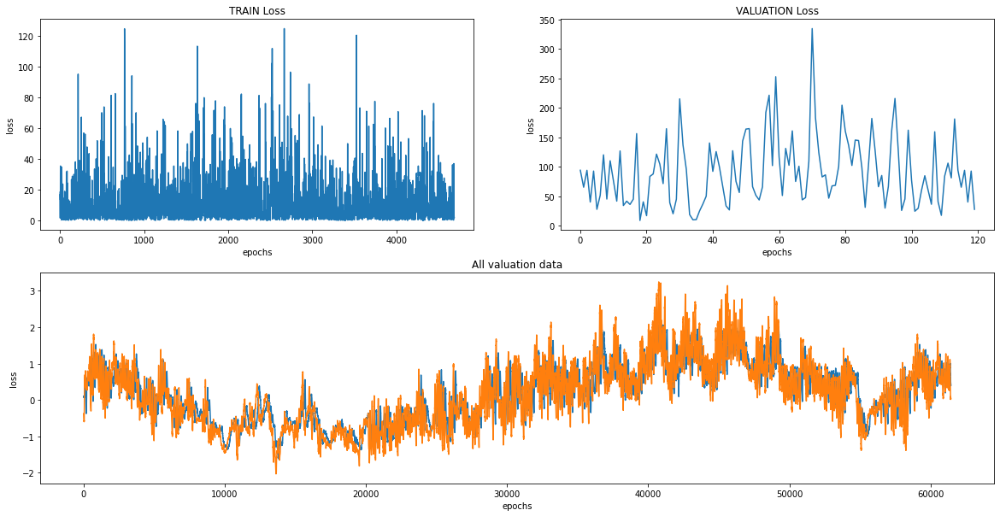

Train parametrs: 0 | 300000 | 64 | False


[5 / 20] Train: MSE Loss = 10.55810: : 4690it [01:55, 40.53it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[5 / 20]   Val: MSE Loss = 86.84290: : 120it [00:05, 23.79it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


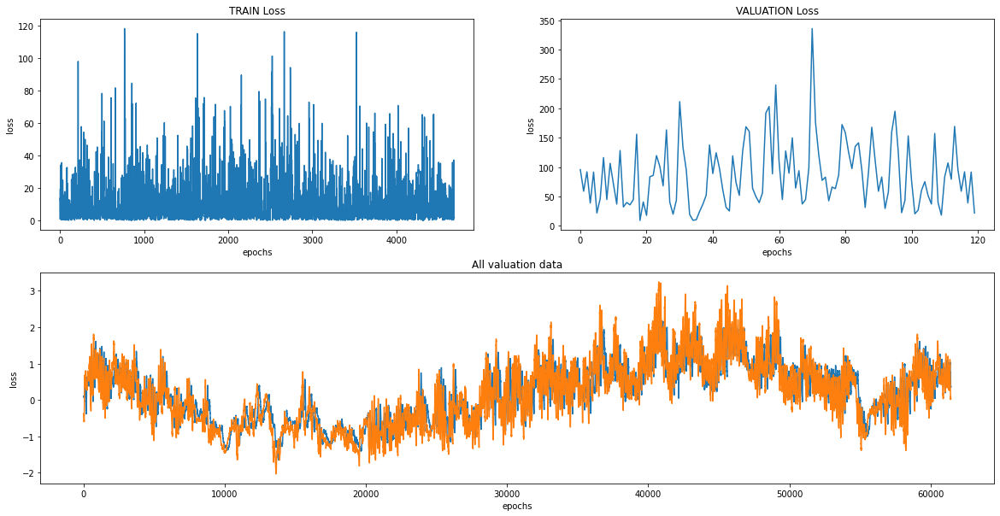

Train parametrs: 0 | 300000 | 64 | False


[6 / 20] Train: MSE Loss = 10.12972: : 4690it [02:01, 38.66it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[6 / 20]   Val: MSE Loss = 84.35762: : 120it [00:05, 20.56it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


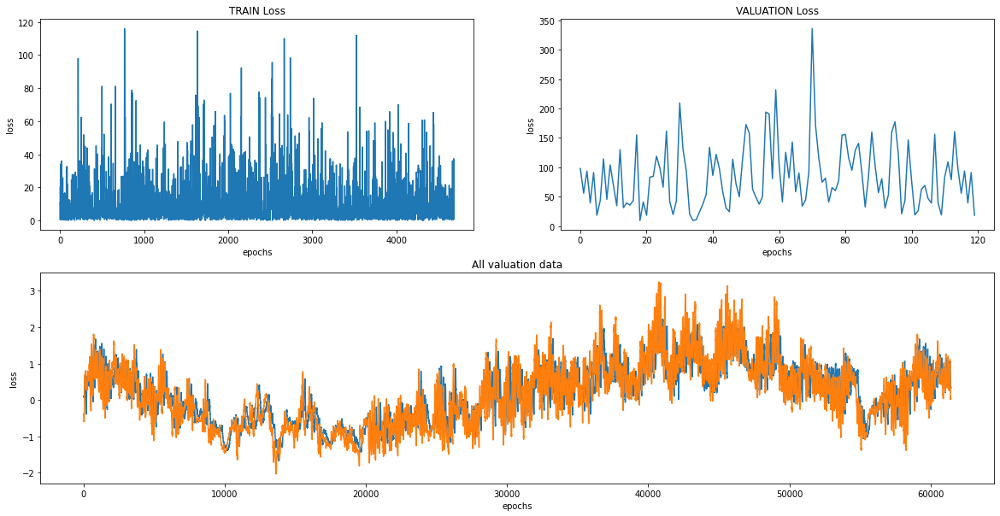

Train parametrs: 0 | 300000 | 64 | False


[7 / 20] Train: MSE Loss = 9.87264: : 4690it [02:08, 36.49it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[7 / 20]   Val: MSE Loss = 82.87585: : 120it [00:05, 22.33it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


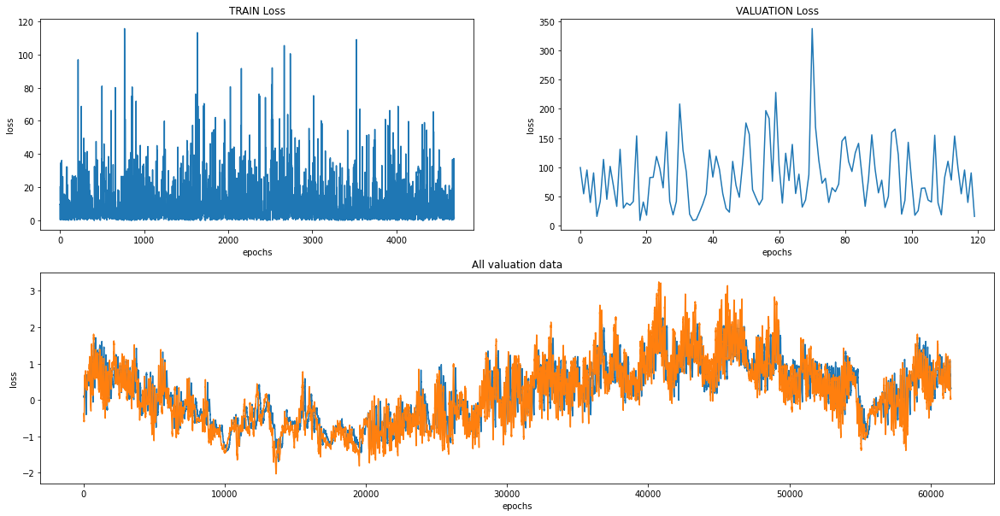

Train parametrs: 0 | 300000 | 64 | False


[8 / 20] Train: MSE Loss = 9.71654: : 4690it [02:03, 38.05it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[8 / 20]   Val: MSE Loss = 81.91199: : 120it [00:05, 21.84it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


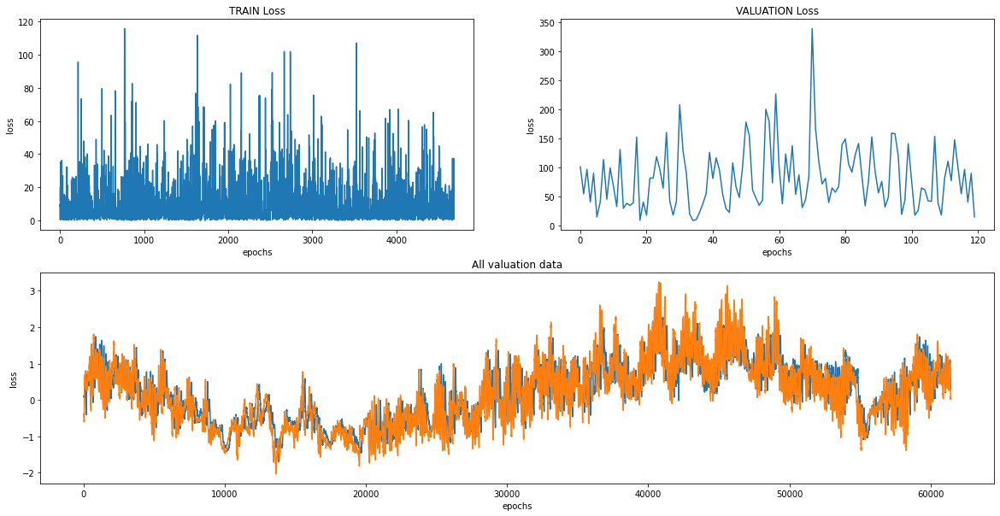

Train parametrs: 0 | 300000 | 64 | False


[9 / 20] Train: MSE Loss = 9.61105: : 4690it [02:07, 36.80it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[9 / 20]   Val: MSE Loss = 81.23365: : 120it [00:05, 20.85it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


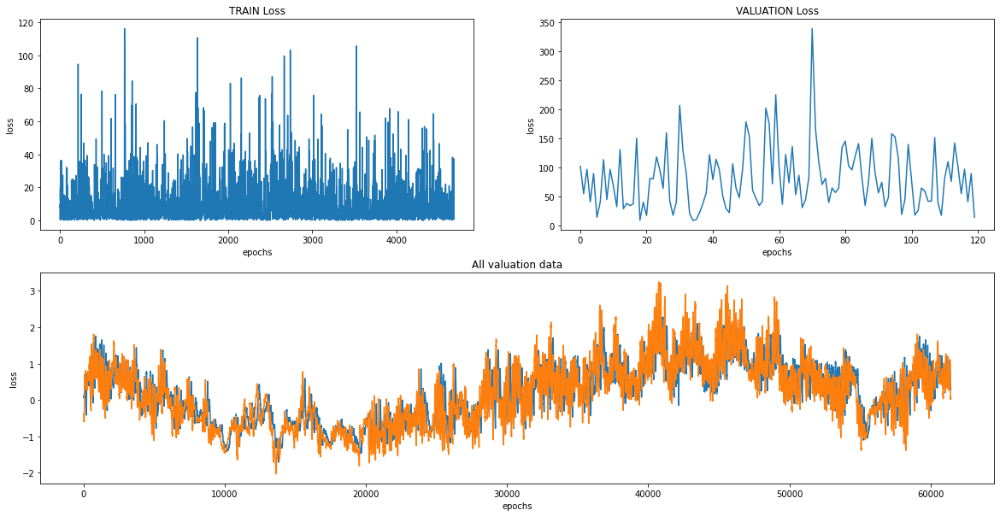

Train parametrs: 0 | 300000 | 64 | False


[10 / 20] Train: MSE Loss = 9.53112: : 4690it [02:08, 36.47it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[10 / 20]   Val: MSE Loss = 80.69100: : 120it [00:06, 17.81it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


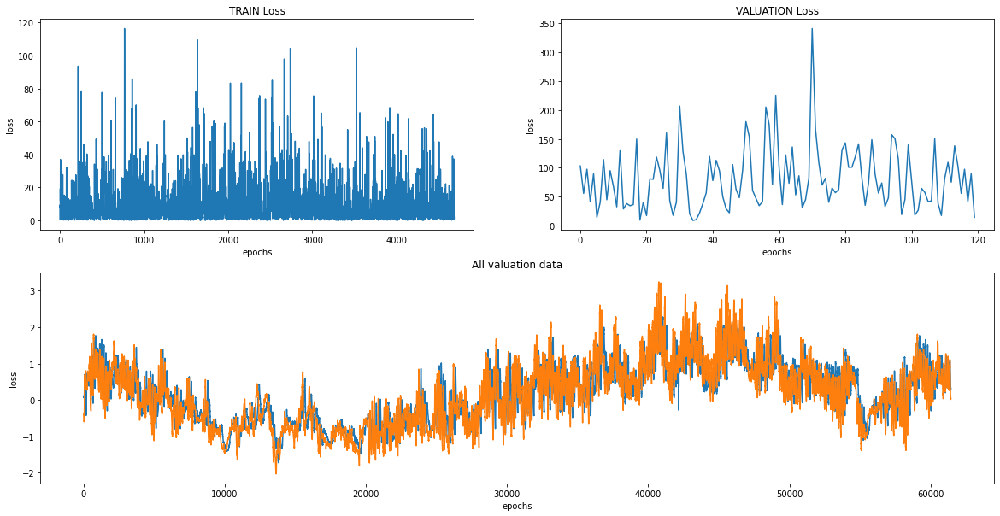

Train parametrs: 0 | 300000 | 64 | False


[11 / 20] Train: MSE Loss = 9.46594: : 4690it [02:10, 36.04it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[11 / 20]   Val: MSE Loss = 80.18903: : 120it [00:06, 17.37it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


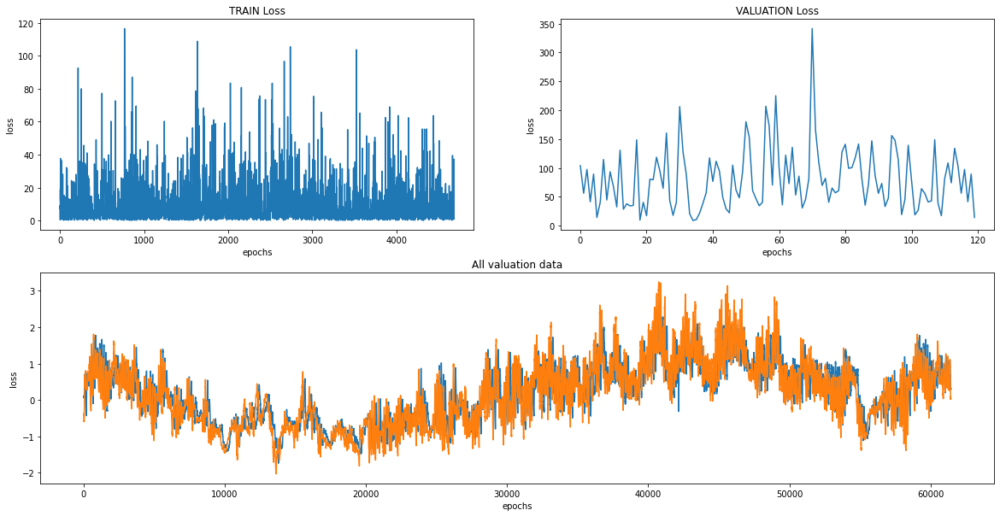

Train parametrs: 0 | 300000 | 64 | False


[12 / 20] Train: MSE Loss = 9.41057: : 4690it [02:10, 35.93it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[12 / 20]   Val: MSE Loss = 79.75165: : 120it [00:06, 17.54it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


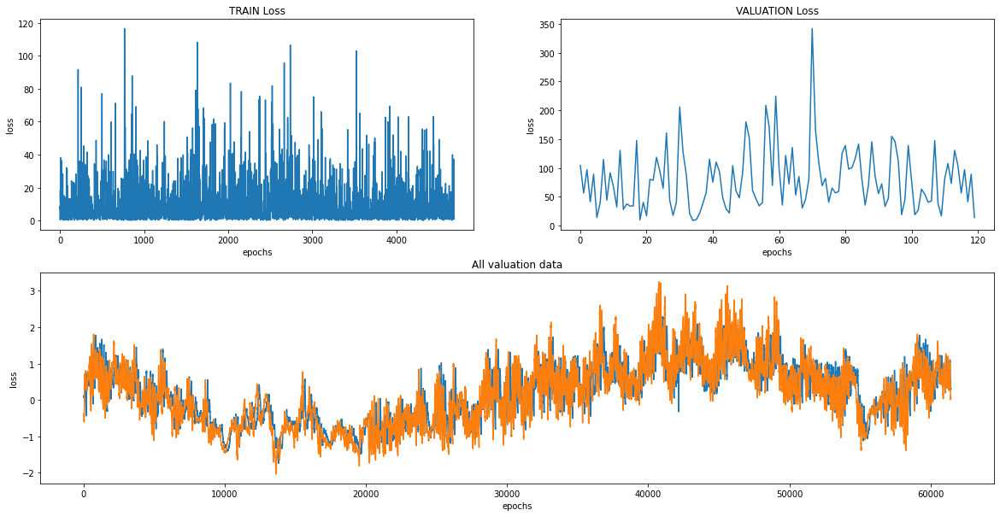

Train parametrs: 0 | 300000 | 64 | False


[13 / 20] Train: MSE Loss = 9.36241: : 4690it [02:08, 36.51it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[13 / 20]   Val: MSE Loss = 79.33729: : 120it [00:06, 17.81it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


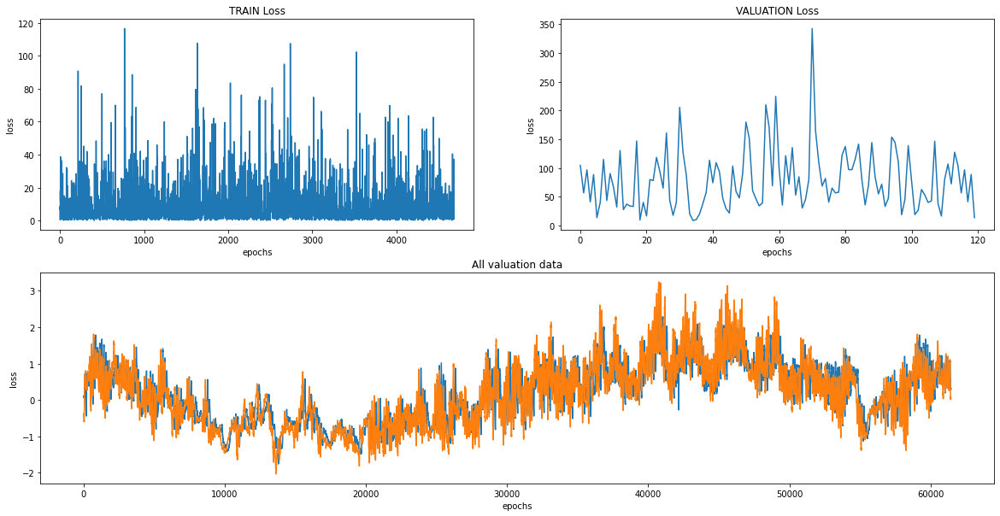

Train parametrs: 0 | 300000 | 64 | False


[14 / 20] Train: MSE Loss = 9.31988: : 4690it [02:09, 36.35it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[14 / 20]   Val: MSE Loss = 78.98525: : 120it [00:06, 17.72it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


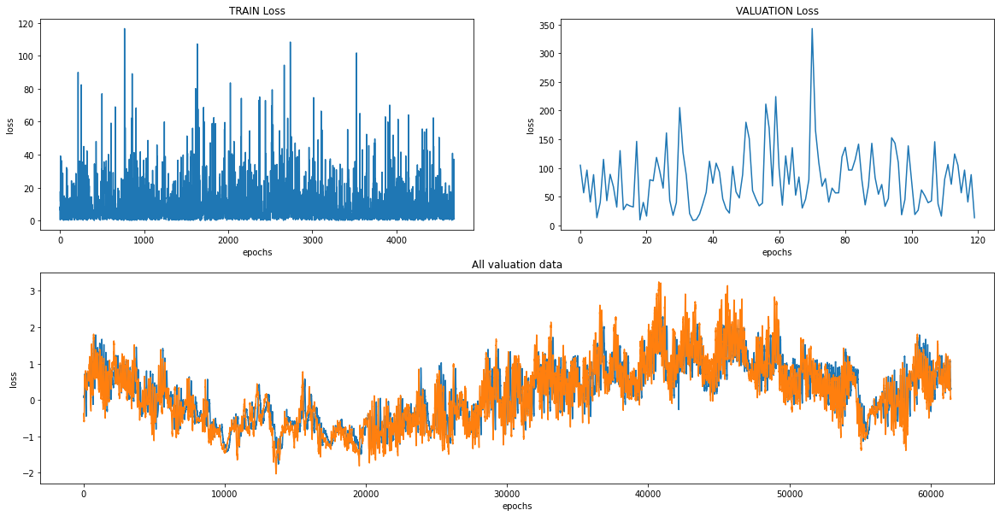

Train parametrs: 0 | 300000 | 64 | False


[15 / 20] Train: MSE Loss = 9.28191: : 4690it [02:17, 34.12it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[15 / 20]   Val: MSE Loss = 78.67327: : 120it [00:08, 14.12it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


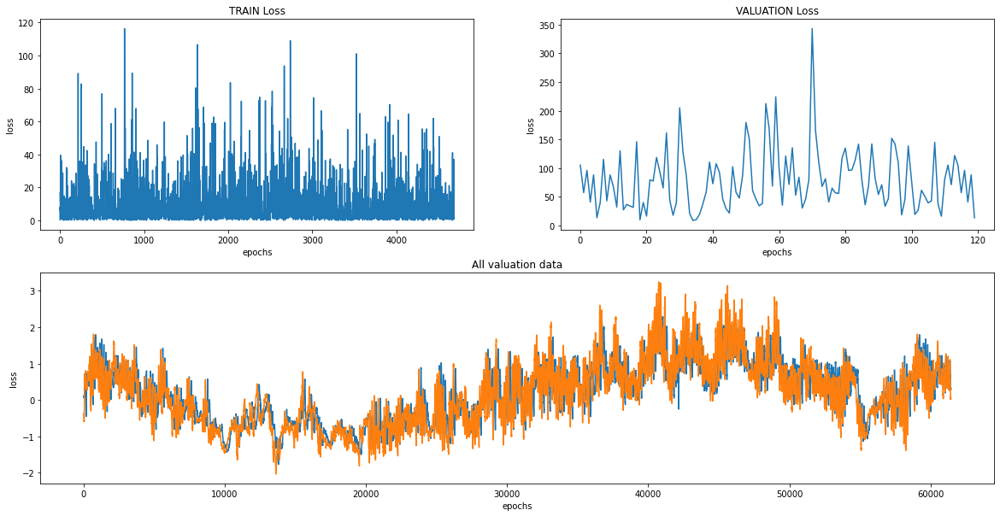

Train parametrs: 0 | 300000 | 64 | False


[16 / 20] Train: MSE Loss = 9.24773: : 4690it [02:21, 33.19it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[16 / 20]   Val: MSE Loss = 78.39063: : 120it [00:06, 17.45it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


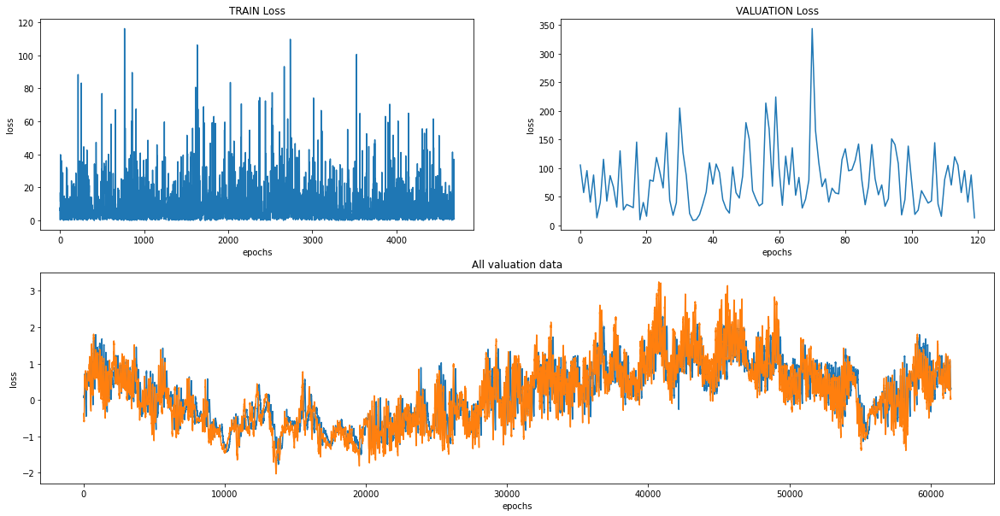

Train parametrs: 0 | 300000 | 64 | False


[17 / 20] Train: MSE Loss = 9.21675: : 4690it [02:15, 34.72it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[17 / 20]   Val: MSE Loss = 78.13090: : 120it [00:09, 13.23it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


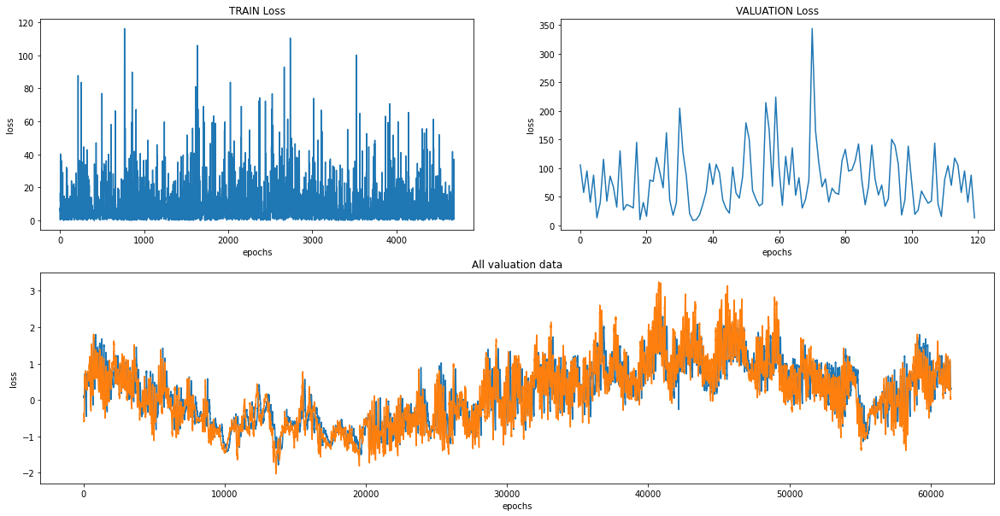

Train parametrs: 0 | 300000 | 64 | False


[18 / 20] Train: MSE Loss = 9.18850: : 4690it [02:09, 36.12it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[18 / 20]   Val: MSE Loss = 77.89659: : 120it [00:06, 17.42it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


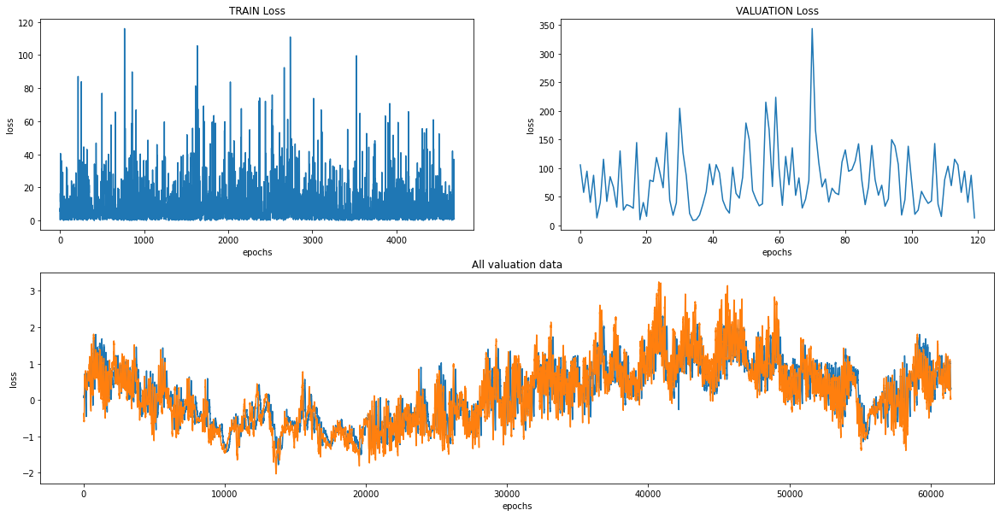

Train parametrs: 0 | 300000 | 64 | False


[19 / 20] Train: MSE Loss = 9.16260: : 4690it [02:09, 36.26it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[19 / 20]   Val: MSE Loss = 77.67942: : 120it [00:06, 17.17it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


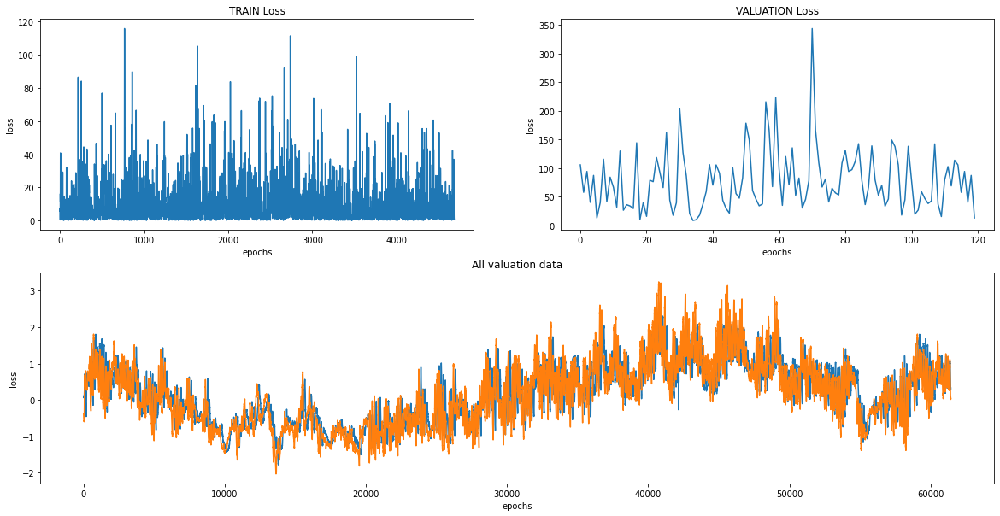

Train parametrs: 0 | 300000 | 64 | False


[20 / 20] Train: MSE Loss = 9.13874: : 4690it [02:10, 36.06it/s]


Valuation parametrs: 300001 | 360000 | 512 | False


[20 / 20]   Val: MSE Loss = 77.48598: : 120it [00:06, 17.27it/s]
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.
  fig.canvas.print_figure(bytes_io, **kw)


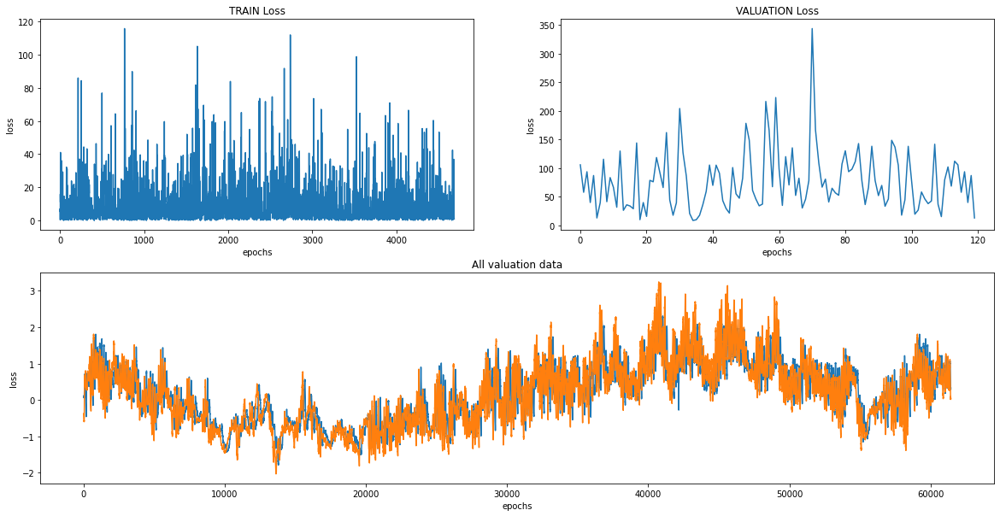

In [68]:
# model 2 – L-2 regularization + learning rate Adam optimizer
lstm_wheather = LSTMWeather(input_size= n_features, 
                            hidden_size= HIDDEN_SIZE, 
                            bidirectional=False, 
                            dropout=0, 
                            num_layers=2).to(device)

# optimizer and criterion
criterion = nn.MSELoss(reduction='sum').to(device)
optimizer = optim.Adam(lstm_wheather.parameters(), lr=1e-5, weight_decay=0.1)


train_loss, val_loss = run_train(lstm_wheather, 
                                 criterion, 
                                 optimizer, 
                                 data_scaled, 
                                 epochs_count=epochs, 
                                 batch_size=batch_size, 
                                 evaluate=True, 
                                 val_batch_size=512)

In [ ]:
# model 3 – 2 LSTM layers (input to linear layer is last h_n)
lstm_wheather = LSTMWeather(input_size= n_features, 
                            hidden_size= HIDDEN_SIZE, 
                            bidirectional=False, 
                            dropout=0, 
                            num_layers=2).to(device)

# optimizer and criterion
criterion = nn.L1Loss().to(device)
optimizer = optim.Adam(lstm_wheather.parameters(), lr=1e-6, weight_decay=0.01)


train_loss, val_loss = run_train(lstm_wheather, 
                                 criterion, 
                                 optimizer, 
                                 data_scaled, 
                                 epochs_count=epochs, 
                                 batch_size=batch_size, 
                                 evaluate=True, 
                                 val_batch_size=512)

In [1]:
# model 4 – 3 LSTM layers + dropout = 10% (input to linear layer is last h_n)
lstm_wheather = LSTMWeather(input_size= n_features, 
                            hidden_size= HIDDEN_SIZE, 
                            bidirectional=False, 
                            dropout=0.1, 
                            num_layers=3).to(device)

# optimizer and criterion
criterion = nn.L1Loss().to(device)
optimizer = optim.Adam(lstm_wheather.parameters(), lr=1e-3, weight_decay=0.01)


train_loss, val_loss = run_train(lstm_wheather, 
                                 criterion, 
                                 optimizer, 
                                 data_scaled, 
                                 epochs_count=epochs, 
                                 batch_size=batch_size, 
                                 evaluate=True, 
                                 val_batch_size=512)

NameError: ignored

In [ ]:
# model 5 – 3 BiLSTM layers + dropout = 15% (input to linear layer is mean of h_n)
lstm_wheather = LSTMWeather(input_size= n_features, 
                            hidden_size= HIDDEN_SIZE, 
                            bidirectional=True, 
                            dropout=0.15, 
                            num_layers=3).to(device)

# optimizer and criterion
criterion = nn.MSELoss(reduction='sum').to(device)
optimizer = optim.Adam(lstm_wheather.parameters(), lr=1e-3, weight_decay=10)


train_loss, val_loss = run_train(lstm_wheather, 
                                 criterion, 
                                 optimizer, 
                                 data_scaled, 
                                 epochs_count=epochs, 
                                 batch_size=batch_size, 
                                 evaluate=True, 
                                 val_batch_size=512)

In [ ]:
# sample, target = next(val_gen)
        
# plot_prediction(X_batch=sample, y_batch=target, preds=sample[:, :, 1][:,-1], n=128)